<a href="https://colab.research.google.com/github/andrewvoss8-boop/core-me-data-science-activities-public/blob/main/BEAM_GP_2_0.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

https://docs.google.com/spreadsheets/d/1ErMwTl1JywOs7L2XZxZnLsHc_FwQNUFmW-RFopLeY_k/edit?usp=sharing

data here


In [8]:
## generates 9 LHS beams from our space.
import pandas as pd
import numpy as np
from scipy.stats import qmc
import warnings

warnings.filterwarnings("ignore")

# ==========================================
# 1. CONFIGURATION
# ==========================================
BOUNDS = {
    'infill': (5, 100),
    'layer': (0.08, 0.32),
    'walls': (1, 5),
    'tops': (1, 6),
    'speed': (50, 300)
}

PARAM_NAMES = ['Infill (%)', 'Layer (mm)', 'Walls', 'Tops', 'Speed (mm/s)']

# ==========================================
# 2. GENERATE PURE LHC SAMPLES
# ==========================================

def generate_lhc_samples(n_samples, n_dims=5, seed=42):
    """
    Generate Latin Hypercube samples completely independent of existing data.
    """
    sampler = qmc.LatinHypercube(d=n_dims, seed=seed)
    samples_norm = sampler.random(n=n_samples)
    return samples_norm

def denormalize(X_norm):
    """Convert normalized [0,1] points back to actual parameter values"""
    X = np.zeros_like(X_norm)
    keys = list(BOUNDS.keys())
    for i, k in enumerate(keys):
        X[:,i] = X_norm[:,i] * (BOUNDS[k][1] - BOUNDS[k][0]) + BOUNDS[k][0]
    return X

def round_to_practical(X):
    """Round parameters to practical/printable values"""
    X_rounded = X.copy()

    # Infill: Round to nearest 5%
    X_rounded[:, 0] = np.round(X_rounded[:, 0] / 5) * 5
    X_rounded[:, 0] = np.clip(X_rounded[:, 0], 5, 100)

    # Layer: Round to 0.01mm
    X_rounded[:, 1] = np.round(X_rounded[:, 1], 2)
    X_rounded[:, 1] = np.clip(X_rounded[:, 1], 0.08, 0.32)

    # Walls: Integer
    X_rounded[:, 2] = np.round(X_rounded[:, 2]).astype(int)
    X_rounded[:, 2] = np.clip(X_rounded[:, 2], 1, 5)

    # Tops: Integer
    X_rounded[:, 3] = np.round(X_rounded[:, 3]).astype(int)
    X_rounded[:, 3] = np.clip(X_rounded[:, 3], 1, 6)

    # Speed: Round to nearest 10
    X_rounded[:, 4] = np.round(X_rounded[:, 4] / 10) * 10
    X_rounded[:, 4] = np.clip(X_rounded[:, 4], 50, 300)

    return X_rounded

def print_beams(title, X):
    """Pretty print beam recommendations"""
    print(f"\n{'='*80}")
    print(f"{title}")
    print(f"{'='*80}")
    print(f"{'#':<4} {'Infill':<8} {'Layer':<8} {'Walls':<7} {'Tops':<6} {'Speed':<8}")
    print("-" * 80)

    for i, params in enumerate(X):
        print(f"{i+1:<4} {params[0]:<8.0f} {params[1]:<8.2f} {params[2]:<7.0f} "
              f"{params[3]:<6.0f} {params[4]:<8.0f}")

def analyze_distribution(X):
    """Analyze the distribution of parameter values"""
    print(f"\n{'='*80}")
    print("DISTRIBUTION ANALYSIS")
    print(f"{'='*80}")

    for i, param in enumerate(PARAM_NAMES):
        vals = X[:, i]
        unique_vals = np.unique(vals)

        print(f"\n{param}:")
        print(f"  Range: [{np.min(vals):.2f}, {np.max(vals):.2f}]")
        print(f"  Unique values: {len(unique_vals)}")
        print(f"  Distribution: {dict(zip(*np.unique(vals, return_counts=True)))}")

# ==========================================
# 3. MAIN EXECUTION
# ==========================================

print("\n" + "="*80)
print("PURE LATIN HYPERCUBE DESIGN")
print("Generates 9 beams with NO consideration of existing data")
print("="*80)

# Generate 9 fresh LHC samples
print("\n🎲 Generating fresh Latin Hypercube samples...")
samples_norm = generate_lhc_samples(n_samples=9, n_dims=5, seed=42)

# Denormalize and round
samples = denormalize(samples_norm)
samples_rounded = round_to_practical(samples)

# Display results
print_beams("9 NEW BEAMS (Pure LHC - Fresh Start)", samples_rounded)

# Analyze distribution
analyze_distribution(samples_rounded)

# ==========================================
# 4. GENERATE MULTIPLE SETS WITH DIFFERENT SEEDS
# ==========================================

print("\n\n" + "="*80)
print("BONUS: 3 ALTERNATIVE SETS (Different Random Seeds)")
print("="*80)
print("Choose whichever set has the best wall/parameter distribution!\n")

for seed_num, seed in enumerate([123, 456, 789], start=1):
    samples_norm_alt = generate_lhc_samples(n_samples=9, n_dims=5, seed=seed)
    samples_alt = denormalize(samples_norm_alt)
    samples_alt_rounded = round_to_practical(samples_alt)

    print(f"\n--- SET {seed_num} (seed={seed}) ---")

    # Quick summary of wall distribution
    walls = samples_alt_rounded[:, 2]
    wall_counts = dict(zip(*np.unique(walls, return_counts=True)))
    print(f"Wall distribution: {wall_counts}")

    # Print full table
    print(f"\n{'#':<4} {'Infill':<8} {'Layer':<8} {'Walls':<7} {'Tops':<6} {'Speed':<8}")
    print("-" * 60)
    for i, params in enumerate(samples_alt_rounded):
        print(f"{i+1:<4} {params[0]:<8.0f} {params[1]:<8.2f} {params[2]:<7.0f} "
              f"{params[3]:<6.0f} {params[4]:<8.0f}")

# ==========================================
# 5. EXPORT TO CSV
# ==========================================

print("\n\n" + "="*80)
print("EXPORTING TO CSV")
print("="*80)

# Export main set
df_main = pd.DataFrame(samples_rounded, columns=['Infill %', 'Layer Height (mm)',
                                                  'Wall Loops', 'Top Layers', 'Print Speed (mm/s)'])
df_main.insert(0, 'Beam #', range(1, len(samples_rounded) + 1))
df_main.to_csv("new_beams_pure_lhc.csv", index=False)
print("✓ Saved: new_beams_pure_lhc.csv")

# Export alternative sets
for seed_num, seed in enumerate([123, 456, 789], start=1):
    samples_norm_alt = generate_lhc_samples(n_samples=9, n_dims=5, seed=seed)
    samples_alt = denormalize(samples_norm_alt)
    samples_alt_rounded = round_to_practical(samples_alt)

    df_alt = pd.DataFrame(samples_alt_rounded, columns=['Infill %', 'Layer Height (mm)',
                                                         'Wall Loops', 'Top Layers', 'Print Speed (mm/s)'])
    df_alt.insert(0, 'Beam #', range(1, len(samples_alt_rounded) + 1))
    filename = f"new_beams_pure_lhc_set{seed_num}.csv"
    df_alt.to_csv(filename, index=False)
    print(f"✓ Saved: {filename}")

# ==========================================
# 6. RECOMMENDATIONS
# ==========================================

print("\n" + "="*80)
print("RECOMMENDATIONS")
print("="*80)
print("""
✅ BEST APPROACH: Pure LHC (This Script)

Why this is better than considering existing data:
1. **Unbiased**: No influence from your walls=4,5 heavy existing data
2. **Systematic**: LHC guarantees even coverage across all dimensions
3. **Reproducible**: Same seed = same results every time
4. **Educational**: Students learn proper experimental design (DOE)

How to choose which set:
- Check the "Wall distribution" for each set
- Pick the one with the most even spread (ideally 1-2 of each wall value)
- Avoid sets that cluster around walls=4,5

Next steps:
1. Review all 4 sets (main + 3 alternatives)
2. Pick the one with best parameter diversity
3. Print and test those 9 beams
4. Combine with your existing 19 for a total of 28 well-distributed points
5. Re-train your GP - it will be MUCH smarter!

Educational moment for students:
"This is a Latin Hypercube design - it ensures we explore the entire
parameter space systematically rather than clustering in one region."
""")
print("="*80)


PURE LATIN HYPERCUBE DESIGN
Generates 9 beams with NO consideration of existing data

🎲 Generating fresh Latin Hypercube samples...

9 NEW BEAMS (Pure LHC - Fresh Start)
#    Infill   Layer    Walls   Tops   Speed   
--------------------------------------------------------------------------------
1    80       0.09     4       1      100     
2    70       0.14     1       2      200     
3    45       0.19     2       5      290     
4    100      0.25     5       2      230     
5    20       0.31     2       3      60      
6    15       0.12     3       4      170     
7    60       0.16     2       6      260     
8    35       0.29     3       4      110     
9    55       0.22     4       5      140     

DISTRIBUTION ANALYSIS

Infill (%):
  Range: [15.00, 100.00]
  Unique values: 9
  Distribution: {np.float64(15.0): np.int64(1), np.float64(20.0): np.int64(1), np.float64(35.0): np.int64(1), np.float64(45.0): np.int64(1), np.float64(55.0): np.int64(1), np.float64(60.0): np.int64

In [20]:
## CONDITIONING THE GP ON NEW DATA AND FINDING NEW BEAMS TO PRINT

import pandas as pd
import numpy as np
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import Matern, WhiteKernel, ConstantKernel
from scipy.optimize import minimize
from scipy.stats import norm
import warnings
import os

warnings.filterwarnings("ignore")

# ==========================================
# CONFIGURATION
# ==========================================
CSV_FILE = "data.csv"

COL_MAP = {
    'infill': 'Infill percent',
    'layer': 'Layer Height(mm)',
    'walls': 'Wall Loops',
    'tops': 'Top Layers',
    'speed': 'Print speed settings',
    'target': 'Str/w (N/g)',
    'material': 'Material'
}

BOUNDS = {
    'infill': (5, 100),
    'layer': (0.08, 0.32),
    'walls': (1, 5),
    'tops': (1, 6),
    'speed': (50, 300)
}
PARAM_NAMES = ['Infill (%)', 'Layer (mm)', 'Walls', 'Tops', 'Speed (mm/s)']

# ==========================================
# INPUT-DEPENDENT NOISE MODEL
# ==========================================
def get_noise_variance(infill_percent):
    """
    Returns noise variance as a function of infill percentage.
    Based on empirical observations with linear interpolation:
    - 100% infill: variance = 1.81e-05 (very precise)
    - 99% infill: variance = 3.0e-04
    - 25%-99%: linear interpolation
    - 25% infill: variance = 1.26e-03
    - <25% infill: extrapolate with increasing noise toward 5%

    These are variances in log(Str/w) space.
    """
    if infill_percent >= 100:
        return 1.81e-05
    elif infill_percent >= 99:
        # Linear interpolation between 99% and 100%
        # At 99%: 3.0e-04, at 100%: 1.81e-05
        t = (infill_percent - 99.0) / (100.0 - 99.0)
        return 3.0e-04 * (1 - t) + 1.81e-05 * t
    elif infill_percent >= 25:
        # Linear interpolation between 25% and 99%
        # At 25%: 1.26e-03, at 99%: 3.0e-04
        t = (infill_percent - 25.0) / (99.0 - 25.0)
        return 1.26e-03 * (1 - t) + 3.0e-04 * t
    else:
        # Extrapolate for very low infill (5% to 25%)
        # Assume noise continues to increase linearly
        # At 5%: even higher noise (extrapolated)
        # At 25%: 1.26e-03
        t = (infill_percent - 5.0) / (25.0 - 5.0)
        noise_at_5_percent = 2.0e-03  # Extrapolated higher noise
        return noise_at_5_percent * (1 - t) + 1.26e-03 * t

def get_alpha_array(X_norm, bounds_dict):
    """
    Compute alpha (noise) array for each data point based on infill.
    Alpha is added to the diagonal of the kernel matrix.
    """
    # Denormalize infill to get actual percentages
    infill_norm = X_norm[:, 0]
    infill_actual = infill_norm * (bounds_dict['infill'][1] - bounds_dict['infill'][0]) + bounds_dict['infill'][0]

    # Get noise variance for each point
    alpha_array = np.array([get_noise_variance(inf) for inf in infill_actual])

    return alpha_array

# ==========================================
# DATA PROCESSING
# ==========================================
def load_and_process_data(csv_path):
    if not os.path.exists(csv_path):
        if os.path.exists("data.csv"): csv_path = "data.csv"
        else: raise FileNotFoundError(f"Could not find {csv_path}")

    df = pd.read_csv(csv_path)
    X = df[[COL_MAP['infill'], COL_MAP['layer'], COL_MAP['walls'],
            COL_MAP['tops'], COL_MAP['speed']]].values
    y = df[COL_MAP['target']].values.astype(float)
    return X, y

def normalize(X):
    X_n = np.copy(X).astype(float)
    keys = list(BOUNDS.keys())
    for i, k in enumerate(keys):
        X_n[:,i] = (X[:,i] - BOUNDS[k][0]) / (BOUNDS[k][1] - BOUNDS[k][0])
    return X_n

def denormalize(X_n):
    X = np.copy(X_n)
    keys = list(BOUNDS.keys())
    for i, k in enumerate(keys):
        X[:,i] = X_n[:,i] * (BOUNDS[k][1] - BOUNDS[k][0]) + BOUNDS[k][0]
    return X

# ==========================================
# ADAPTIVE PARAMETER FUNCTIONS
# ==========================================
def get_adaptive_length_scale_bounds(n_samples, n_dims=5):
    """Adjust length scale bounds based on data quantity."""
    samples_per_dim = n_samples / n_dims

    if samples_per_dim < 4:
        min_scale = 0.3
        max_scale = 5.0
        strategy = "PURE EXPLORATION (too little data)"
    elif samples_per_dim < 10:
        min_scale = 0.15
        max_scale = 3.0
        strategy = "BALANCED (building knowledge)"
    else:
        min_scale = 0.05
        max_scale = 10.0
        strategy = "FINE-TUNING (enough data to detect patterns)"

    return (min_scale, max_scale), strategy

# ==========================================
# GP TRAINING WITH INPUT-DEPENDENT NOISE
# ==========================================
def train_adaptive_gp(X, y, n_samples):
    """Train GP with adaptive length scales and input-dependent noise"""
    X_norm = normalize(X)
    y_log = np.log(y)
    y_mean = np.mean(y_log)
    y_centered = y_log - y_mean

    ls_bounds, strategy = get_adaptive_length_scale_bounds(n_samples)

    print(f"\n📊 Dataset: {n_samples} samples ({n_samples/5:.1f} per dimension)")
    print(f"🎯 Strategy: {strategy}")
    print(f"🔧 Length scale bounds: [{ls_bounds[0]:.2f}, {ls_bounds[1]:.2f}]")
    print(f"🔊 Using input-dependent noise model (linear scale):")
    print(f"   100% infill: σ² = 1.81e-05 (very precise)")
    print(f"    99% infill: σ² = 3.00e-04")
    print(f"    25% infill: σ² = 1.26e-03")
    print(f"     5% infill: σ² = 2.00e-03 (extrapolated)")
    print(f"   Linear interpolation between anchor points")

    # Build kernel without WhiteKernel - we'll use alpha for noise
    kernel = ConstantKernel(1.0) * \
             Matern(length_scale=[0.5]*5, length_scale_bounds=ls_bounds, nu=2.5)

    # Get input-dependent noise array
    alpha_array = get_alpha_array(X_norm, BOUNDS)

    # Fit GP with input-dependent alpha
    gp = GaussianProcessRegressor(kernel=kernel, n_restarts_optimizer=25,
                                  alpha=alpha_array, normalize_y=False)
    gp.fit(X_norm, y_centered)

    return gp, X_norm, y_centered, y_mean, strategy

# ==========================================
# ACQUISITION FUNCTIONS
# ==========================================
def sequential_kriging_ucb(gp, X_norm, y_centered, y_mean, kappa=5.0, n_suggestions=3):
    """
    Sequential Kriging with UCB.
    Fantasizes pending evaluations to generate diverse suggestions.
    """
    suggestions = []
    preds = []

    X_temp = X_norm.copy()
    y_temp = y_centered.copy()

    # Get original kernel hyperparameters
    ls_bounds = gp.kernel.k2.length_scale_bounds

    for i in range(n_suggestions):
        # Get alpha array for current data (including fantasized points)
        alpha_temp = get_alpha_array(X_temp, BOUNDS)

        # Build kernel - use original hyperparameters as starting point
        if i == 0:
            initial_length_scale = gp.kernel_.k2.length_scale
        else:
            initial_length_scale = gp_temp.kernel_.k2.length_scale

        kernel = ConstantKernel(1.0) * \
                 Matern(length_scale=initial_length_scale,
                        length_scale_bounds=ls_bounds, nu=2.5)

        # Create new GP with updated alpha
        gp_temp = GaussianProcessRegressor(kernel=kernel, n_restarts_optimizer=3,
                                           alpha=alpha_temp, normalize_y=False)

        # Fit GP
        gp_temp.fit(X_temp, y_temp)

        def neg_ucb(x):
            x_in = x.reshape(1, -1)
            mu, sigma = gp_temp.predict(x_in, return_std=True)
            ucb = mu + (kappa * sigma)
            return -ucb.item()

        # Multi-start optimization
        best_x = None
        best_score = 1e10

        for _ in range(30):
            x0 = np.random.uniform(0, 1, 5)
            res = minimize(neg_ucb, x0, bounds=[(0,1)]*5, method='L-BFGS-B')
            if res.fun < best_score:
                best_score = res.fun
                best_x = res.x

        # Save suggestion
        suggestions.append(denormalize(best_x.reshape(1, -1))[0])
        mu_pred, _ = gp_temp.predict(best_x.reshape(1, -1), return_std=True)
        preds.append(np.exp(mu_pred + y_mean).item())

        # Fantasize: assume this point achieves the predicted mean
        X_temp = np.vstack([X_temp, best_x])
        y_temp = np.append(y_temp, mu_pred)

    return suggestions, preds

def sequential_kriging_ei(gp, X_norm, y_centered, y_mean, n_suggestions=3):
    """
    Sequential Kriging with Constant Liar (EI-based).
    Assumes best-case scenario for pending evaluations.
    """
    suggestions = []
    preds = []

    X_temp = X_norm.copy()
    y_temp = y_centered.copy()

    # Get original kernel hyperparameters
    ls_bounds = gp.kernel.k2.length_scale_bounds

    for i in range(n_suggestions):
        # Get alpha array for current data (including fantasized points)
        alpha_temp = get_alpha_array(X_temp, BOUNDS)

        # Build kernel - use original hyperparameters as starting point if available
        if i == 0:
            # First iteration: use original GP's fitted hyperparameters
            initial_length_scale = gp.kernel_.k2.length_scale
        else:
            # Subsequent iterations: use previous fitted hyperparameters
            initial_length_scale = gp_temp.kernel_.k2.length_scale

        kernel = ConstantKernel(1.0) * \
                 Matern(length_scale=initial_length_scale,
                        length_scale_bounds=ls_bounds, nu=2.5)

        # Create new GP with updated alpha - allow light re-optimization
        gp_temp = GaussianProcessRegressor(kernel=kernel, n_restarts_optimizer=3,
                                           alpha=alpha_temp, normalize_y=False)

        # Fit GP
        gp_temp.fit(X_temp, y_temp)

        best_y_current = np.max(y_temp)

        def neg_ei(x):
            x_in = x.reshape(1, -1)
            mu, sigma = gp_temp.predict(x_in, return_std=True)

            if sigma < 1e-9:
                return 0.0

            Z = (mu - best_y_current) / sigma
            ei = (mu - best_y_current) * norm.cdf(Z) + sigma * norm.pdf(Z)
            return -ei.item()

        # Multi-start optimization
        best_x = None
        best_score = 1e10

        for _ in range(30):
            x0 = np.random.uniform(0, 1, 5)
            res = minimize(neg_ei, x0, bounds=[(0,1)]*5, method='L-BFGS-B')
            if res.fun < best_score:
                best_score = res.fun
                best_x = res.x

        # Save suggestion
        suggestions.append(denormalize(best_x.reshape(1, -1))[0])
        mu_pred, _ = gp_temp.predict(best_x.reshape(1, -1), return_std=True)
        preds.append(np.exp(mu_pred + y_mean).item())

        # Fantasize: assume this point achieves the predicted mean (Constant Liar)
        X_temp = np.vstack([X_temp, best_x])
        y_temp = np.append(y_temp, mu_pred)

    return suggestions, preds

def staggered_ucb(gp, X_norm, y_centered, y_mean, kappas=[2.0, 5.0, 8.0]):
    """
    UCB with different kappa values for diversity.
    Lower kappa = exploit, higher kappa = explore.
    """
    suggestions = []
    preds = []

    gp.fit(X_norm, y_centered)

    for kappa in kappas:
        def neg_ucb(x):
            x_in = x.reshape(1, -1)
            mu, sigma = gp.predict(x_in, return_std=True)
            ucb = mu + (kappa * sigma)
            return -ucb.item()

        best_x = None
        best_score = 1e10

        for _ in range(30):
            x0 = np.random.uniform(0, 1, 5)
            res = minimize(neg_ucb, x0, bounds=[(0,1)]*5, method='L-BFGS-B')
            if res.fun < best_score:
                best_score = res.fun
                best_x = res.x

        suggestions.append(denormalize(best_x.reshape(1, -1))[0])
        mu_pred, _ = gp.predict(best_x.reshape(1, -1), return_std=True)
        preds.append(np.exp(mu_pred + y_mean).item())

    return suggestions, preds

# ==========================================
# OUTPUT FORMATTING
# ==========================================
def round_to_practical(X):
    """Round to printable values"""
    X_r = X.copy()
    X_r[0] = np.round(X_r[0] / 5) * 5
    X_r[0] = np.clip(X_r[0], 5, 100)
    X_r[1] = np.round(X_r[1], 2)
    X_r[1] = np.clip(X_r[1], 0.08, 0.32)
    X_r[2] = np.clip(np.round(X_r[2]), 1, 5)
    X_r[3] = np.clip(np.round(X_r[3]), 1, 6)
    X_r[4] = np.round(X_r[4] / 10) * 10
    X_r[4] = np.clip(X_r[4], 50, 300)
    return X_r

def print_beams(title, suggestions, preds, labels=None):
    print(f"\n{title}")
    print(f"{'Type':<15} {'Infill':<8} {'Layer':<8} {'Walls':<6} {'Tops':<6} {'Speed':<8} | {'Pred':<6}")
    print("-" * 75)

    if labels is None:
        labels = [f"#{i+1}" for i in range(len(suggestions))]

    for i, (label, s, p) in enumerate(zip(labels, suggestions, preds)):
        s_rounded = round_to_practical(s)
        print(f"{label:<15} {s_rounded[0]:<8.0f} {s_rounded[1]:<8.2f} {s_rounded[2]:<6.0f} "
              f"{s_rounded[3]:<6.0f} {s_rounded[4]:<8.0f} | {p:.2f}")

def print_ard_summary(gp):
    # Extract length scales from kernel
    # Structure: ConstantKernel * Matern
    # After fitting: kernel_ has the structure k1 (ConstantKernel) * k2 (Matern)
    if hasattr(gp.kernel_, 'k2'):
        # Direct product kernel
        scales = gp.kernel_.k2.length_scale
    elif hasattr(gp.kernel_, 'k1') and hasattr(gp.kernel_.k1, 'k2'):
        # Nested product
        scales = gp.kernel_.k1.k2.length_scale
    else:
        # Try to find Matern kernel
        kernel = gp.kernel_
        while hasattr(kernel, 'k1') or hasattr(kernel, 'k2'):
            if hasattr(kernel, 'k2') and hasattr(kernel.k2, 'length_scale'):
                scales = kernel.k2.length_scale
                break
            elif hasattr(kernel, 'k1') and hasattr(kernel.k1, 'length_scale'):
                scales = kernel.k1.length_scale
                break
            elif hasattr(kernel, 'k2'):
                kernel = kernel.k2
            elif hasattr(kernel, 'k1'):
                kernel = kernel.k1
            else:
                break
        else:
            # Fallback: kernel itself has length_scale
            scales = kernel.length_scale

    print(f"\n{'Parameter':<12} | {'Length Scale':<12} | {'Interpretation'}")
    print("-" * 50)
    for name, scale in zip(PARAM_NAMES, scales):
        if scale < 0.2: status = "Very Sensitive"
        elif scale < 1.0: status = "High Influence"
        elif scale > 3.0: status = "Low Influence"
        else: status = "Moderate"
        print(f"{name:<12} | {scale:<12.4f} | {status}")

# ==========================================
# MAIN EXECUTION
# ==========================================

print("\n" + "="*70)
print("ADAPTIVE BAYESIAN OPTIMIZATION v2.0")
print("- Input-dependent noise model")
print("- EI with Sequential Kriging (Constant Liar)")
print("- UCB with staggered kappa values")
print("="*70)

X, y = load_and_process_data(CSV_FILE)
n_samples = len(X)

# Train adaptive GP with input-dependent noise
gp, X_norm, y_centered, y_mean, strategy = train_adaptive_gp(X, y, n_samples)

# Show ARD analysis
print("\n--- ARD ANALYSIS ---")
print_ard_summary(gp)

# Strategy 1: Sequential Kriging with EI
print("\n" + "="*70)
print("STRATEGY 1: Expected Improvement with Sequential Kriging")
print("="*70)
print("Uses 'Constant Liar' fantasizing:")
print("- Find best EI point")
print("- Assume it achieves predicted mean")
print("- Re-train GP and find next point")
print("- Repeat for 3 suggestions")

ei_suggestions, ei_preds = sequential_kriging_ei(gp, X_norm, y_centered, y_mean, n_suggestions=3)
ei_labels = ["EI #1", "EI #2", "EI #3"]
print_beams("\n🎯 NEXT 3 BEAMS (Sequential EI):", ei_suggestions, ei_preds, ei_labels)

# Strategy 2: Sequential Kriging with UCB
print("\n" + "="*70)
print("STRATEGY 2: UCB with Sequential Kriging")
print("="*70)
print("Uses 'Constant Liar' fantasizing with UCB:")
print("- Find best UCB point")
print("- Assume it achieves predicted mean")
print("- Re-train GP and find next point")
print("- Repeat for 3 suggestions")

# Choose appropriate kappa based on data size
samples_per_dim = n_samples / 5
if samples_per_dim < 4:
    kappa = 6.0  # High exploration when data is sparse
    print(f"⚠️  Using κ={kappa:.1f} (high exploration for sparse data)")
elif samples_per_dim < 10:
    kappa = 4.0  # Balanced
    print(f"κ={kappa:.1f} (balanced exploration/exploitation)")
else:
    kappa = 2.0  # More exploitation with more data
    print(f"κ={kappa:.1f} (focused exploitation with sufficient data)")

ucb_suggestions, ucb_preds = sequential_kriging_ucb(gp, X_norm, y_centered, y_mean, kappa=kappa, n_suggestions=3)
ucb_labels = [f"UCB #{i+1}" for i in range(3)]
print_beams("\n🎯 NEXT 3 BEAMS (Sequential UCB):", ucb_suggestions, ucb_preds, ucb_labels)

# ==========================================
# COMBINED RECOMMENDATIONS
# ==========================================
print("\n" + "="*70)
print("COMBINED RECOMMENDATION: 6 BEAMS TOTAL")
print("="*70)
print("Print all 6 beams for maximum information gain:")

all_suggestions = ei_suggestions + ucb_suggestions
all_preds = ei_preds + ucb_preds
all_labels = ei_labels + ucb_labels

print_beams("\n🎯 ALL 6 RECOMMENDED BEAMS:", all_suggestions, all_preds, all_labels)

# Check for diversity
print("\n📊 Diversity Check:")
all_rounded = np.array([round_to_practical(s) for s in all_suggestions])
print(f"Unique infill values: {len(np.unique(all_rounded[:, 0]))}")
print(f"Unique wall values: {len(np.unique(all_rounded[:, 2]))}")
print(f"Unique layer values: {len(np.unique(all_rounded[:, 1]))}")

if len(np.unique(all_rounded, axis=0)) < 5:
    print("\n⚠️  WARNING: Some duplicate beams detected after rounding!")
    print("   This can happen with very sparse data.")
    print("   Consider adding random perturbations or using LHC.")

# ==========================================
# SAVE RECOMMENDATIONS FOR PLOTTING
# ==========================================
print("\n" + "="*70)
print("SAVING RECOMMENDATIONS")
print("="*70)

# Export to CSV
all_suggestions_rounded = np.array([round_to_practical(s) for s in all_suggestions])
df_recommendations = pd.DataFrame(all_suggestions_rounded,
                                  columns=['Infill %', 'Layer Height (mm)',
                                          'Wall Loops', 'Top Layers', 'Print Speed (mm/s)'])
df_recommendations.insert(0, 'Type', all_labels)
df_recommendations['Predicted Str/w'] = [f"{p:.2f}" for p in all_preds]
df_recommendations.to_csv("bo_recommendations.csv", index=False)
print("✓ Saved: bo_recommendations.csv")

# Save normalized versions for plotting
np.save("bo_recommendations_norm.npy", np.array([normalize(s.reshape(1, -1))[0] for s in all_suggestions]))
np.save("bo_labels.npy", np.array(all_labels))
print("✓ Saved: bo_recommendations_norm.npy (for plotting)")
print("✓ Saved: bo_labels.npy")

print("\n" + "="*70)


ADAPTIVE BAYESIAN OPTIMIZATION v2.0
- Input-dependent noise model
- EI with Sequential Kriging (Constant Liar)
- UCB with staggered kappa values

📊 Dataset: 18 samples (3.6 per dimension)
🎯 Strategy: PURE EXPLORATION (too little data)
🔧 Length scale bounds: [0.30, 5.00]
🔊 Using input-dependent noise model (linear scale):
   100% infill: σ² = 1.81e-05 (very precise)
    99% infill: σ² = 3.00e-04
    25% infill: σ² = 1.26e-03
     5% infill: σ² = 2.00e-03 (extrapolated)
   Linear interpolation between anchor points

--- ARD ANALYSIS ---

Parameter    | Length Scale | Interpretation
--------------------------------------------------
Infill (%)   | 0.6186       | High Influence
Layer (mm)   | 5.0000       | Low Influence
Walls        | 1.7796       | Moderate
Tops         | 1.3216       | Moderate
Speed (mm/s) | 3.4470       | Low Influence

STRATEGY 1: Expected Improvement with Sequential Kriging
Uses 'Constant Liar' fantasizing:
- Find best EI point
- Assume it achieves predicted mean
-

Loading data and training GP...
✓ Loaded 6 recommendations

Generating 1D plots...


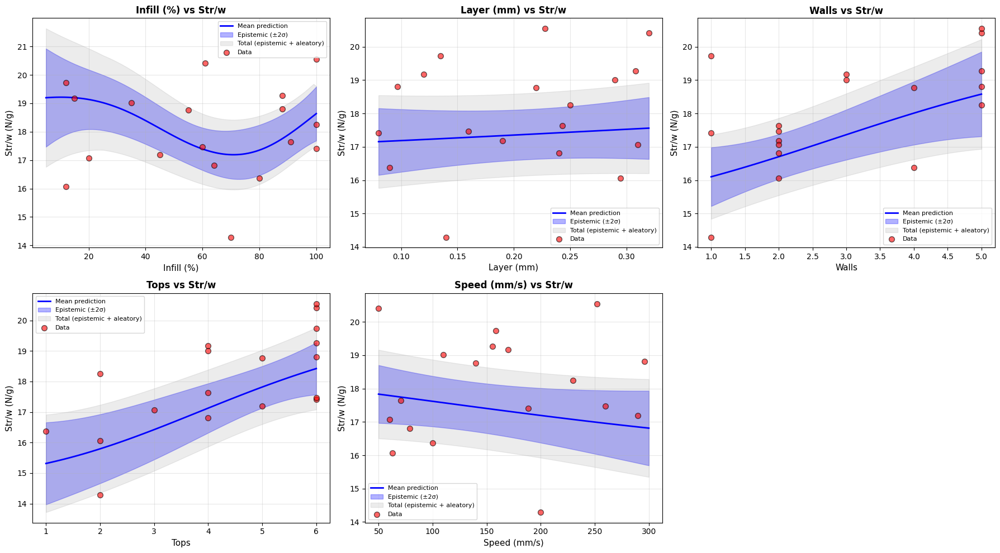


Generating 2D contour plots (global averages)...


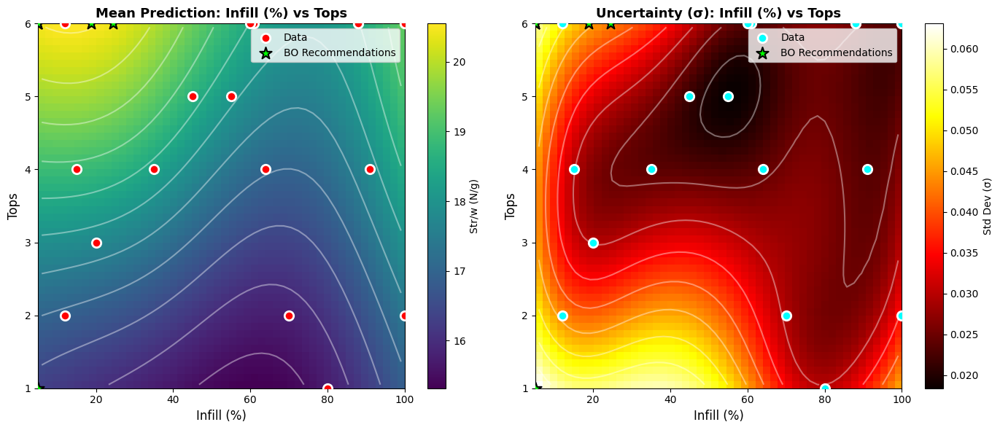

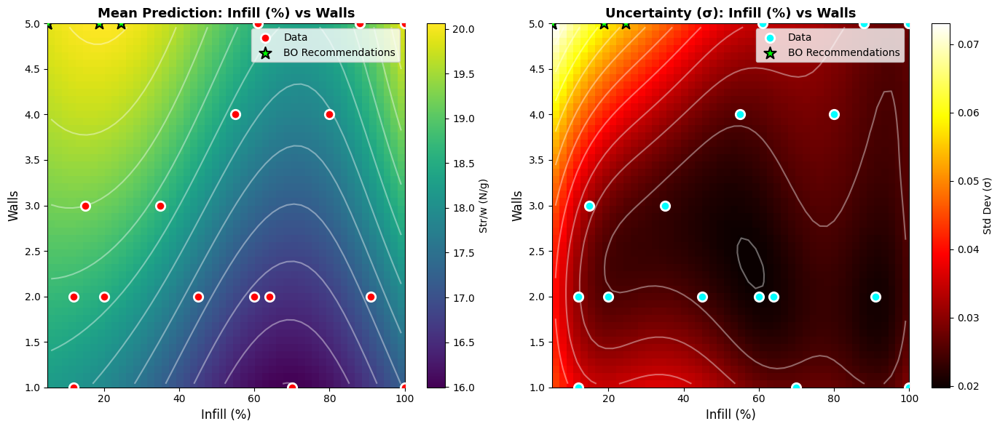

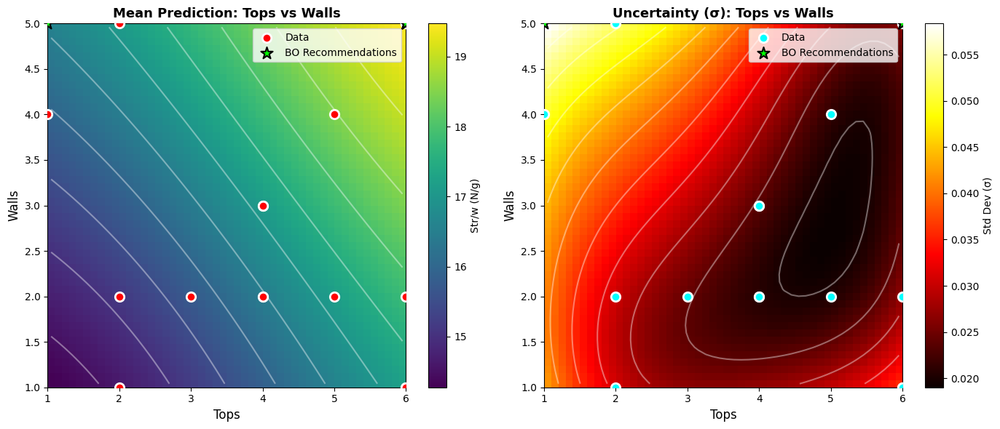

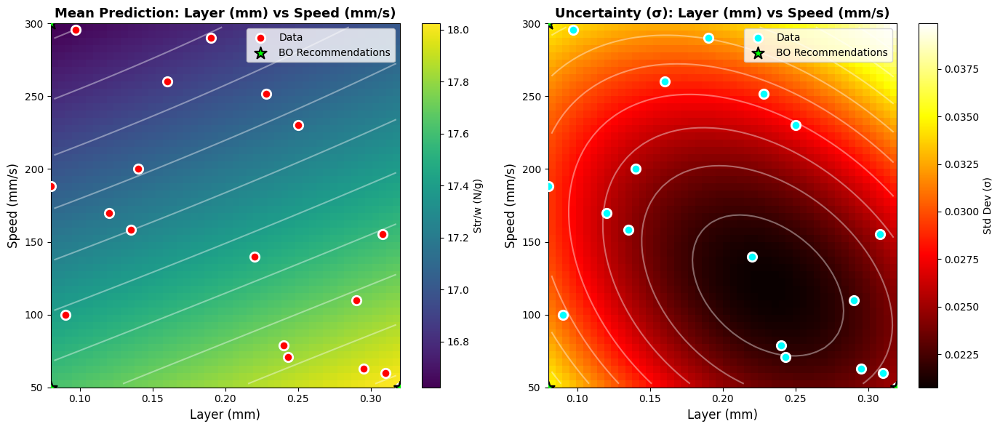


✓ Global plots complete!

Generating slice plots...
  Plotting slice: Top #1 (Str/w=20.55)
    Point distribution by proximity:
      Very close (<0.15): 1
      Close (0.15-0.30): 0
      Moderate (0.30-0.50): 0
      Far (0.50-0.75): 3
      Very far (>0.75): 14


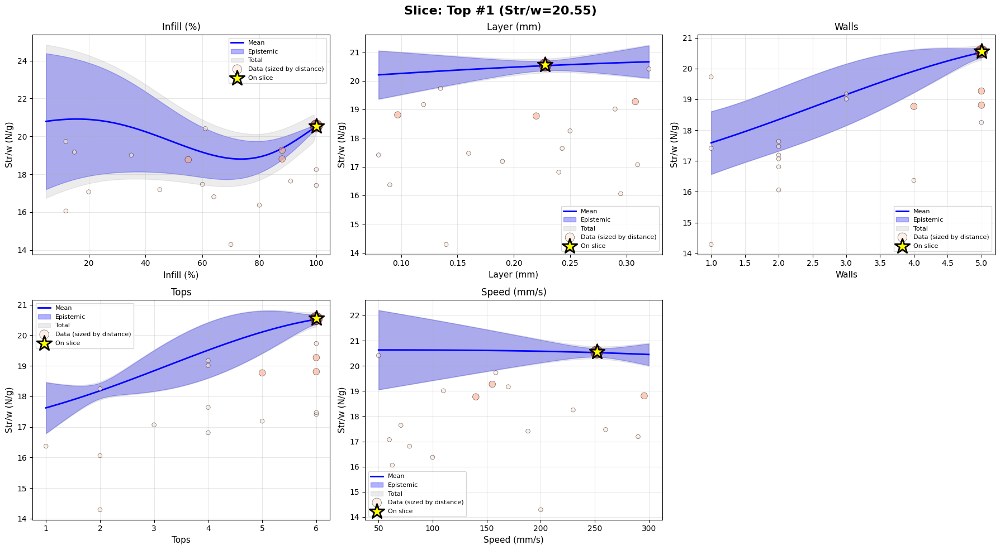

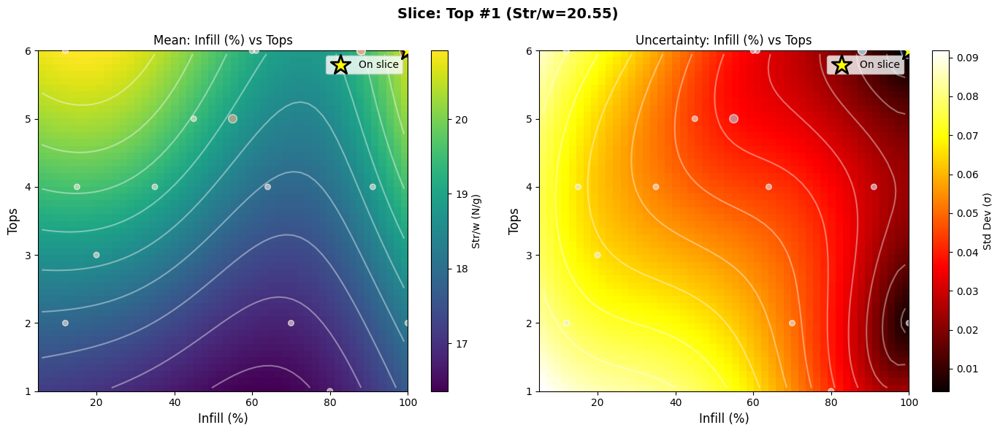

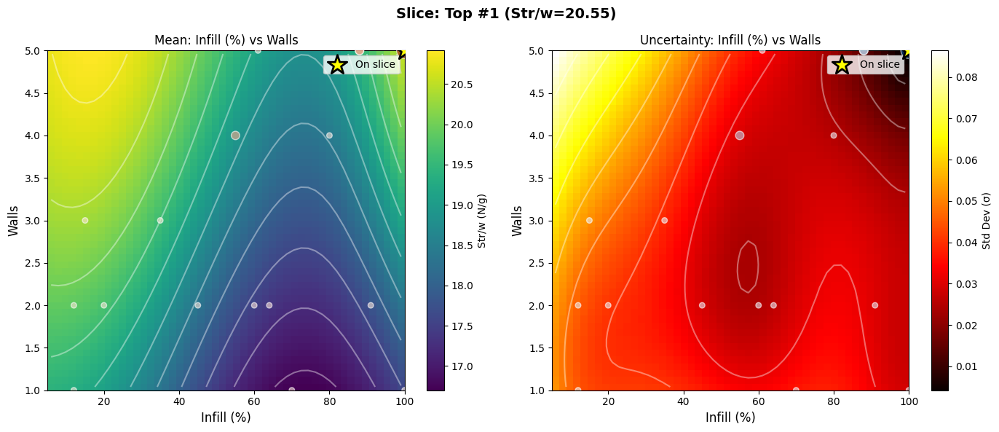

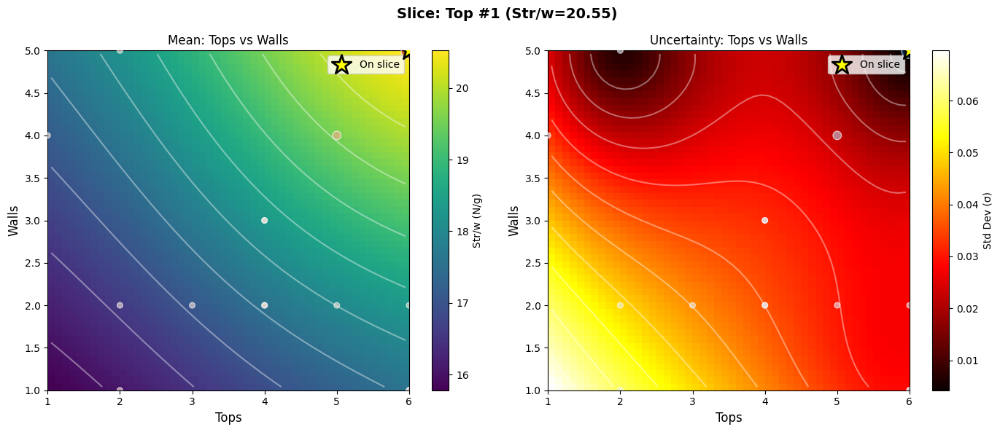

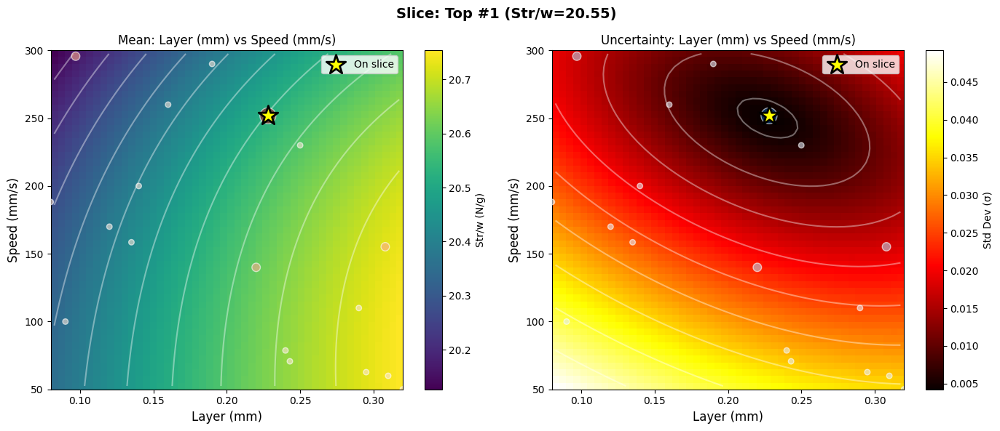

  Plotting slice: Top #2 (Str/w=20.41)
    Point distribution by proximity:
      Very close (<0.15): 1
      Close (0.15-0.30): 0
      Moderate (0.30-0.50): 0
      Far (0.50-0.75): 3
      Very far (>0.75): 14


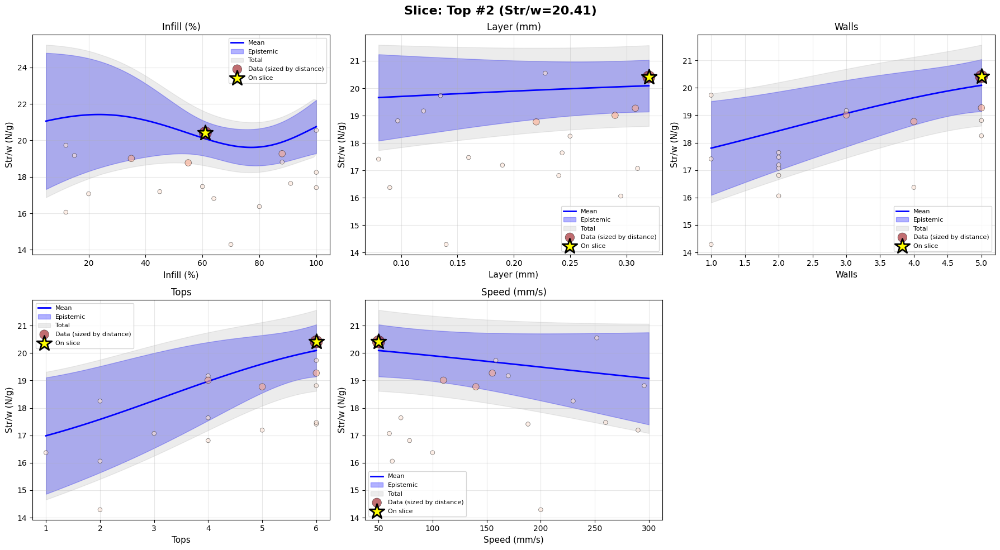

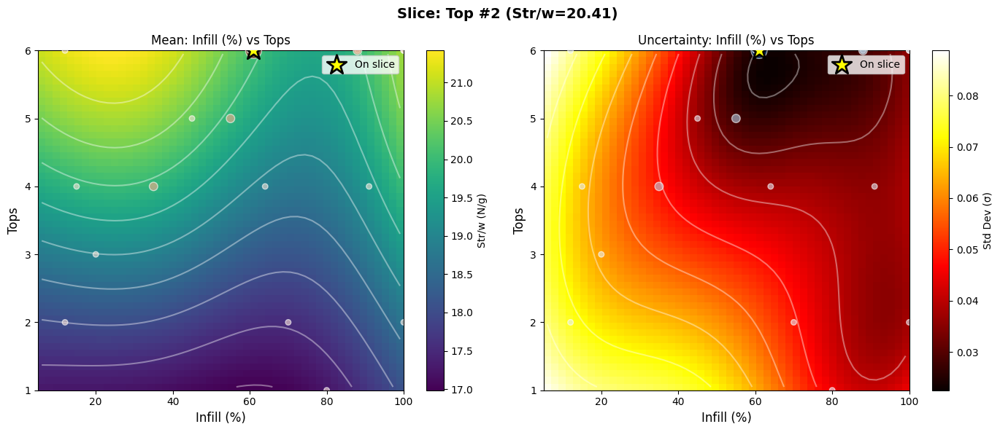

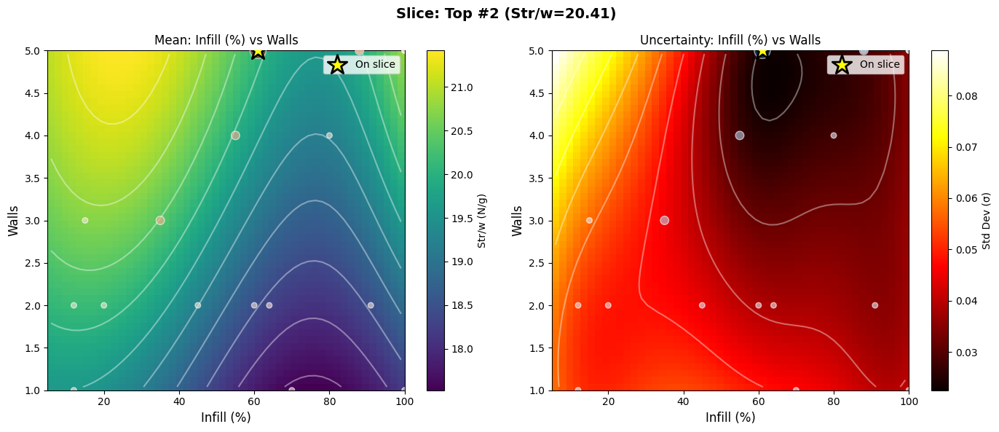

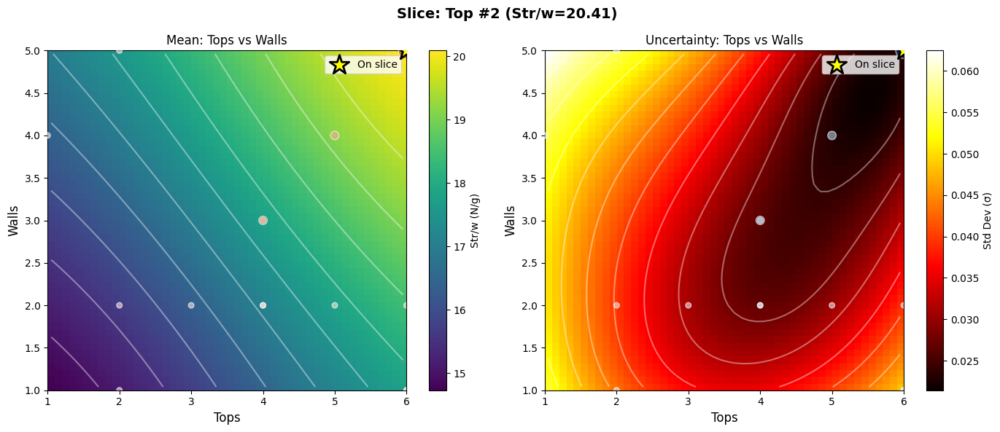

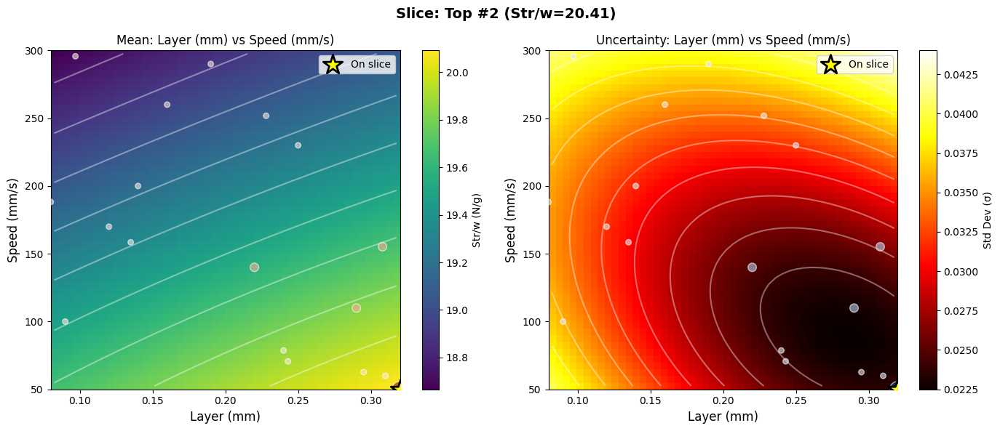

  Plotting slice: Top #3 (Str/w=19.73)
    Point distribution by proximity:
      Very close (<0.15): 1
      Close (0.15-0.30): 0
      Moderate (0.30-0.50): 0
      Far (0.50-0.75): 3
      Very far (>0.75): 14


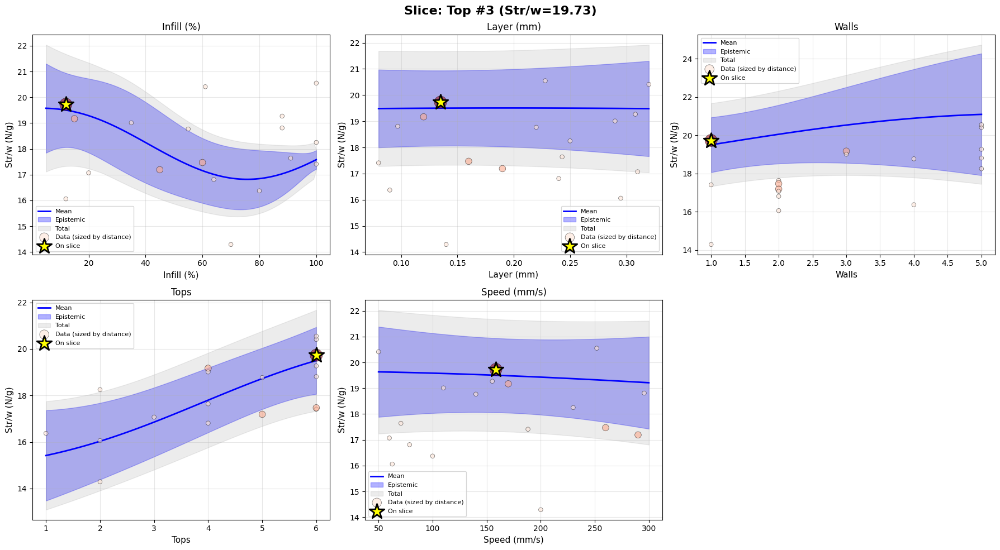

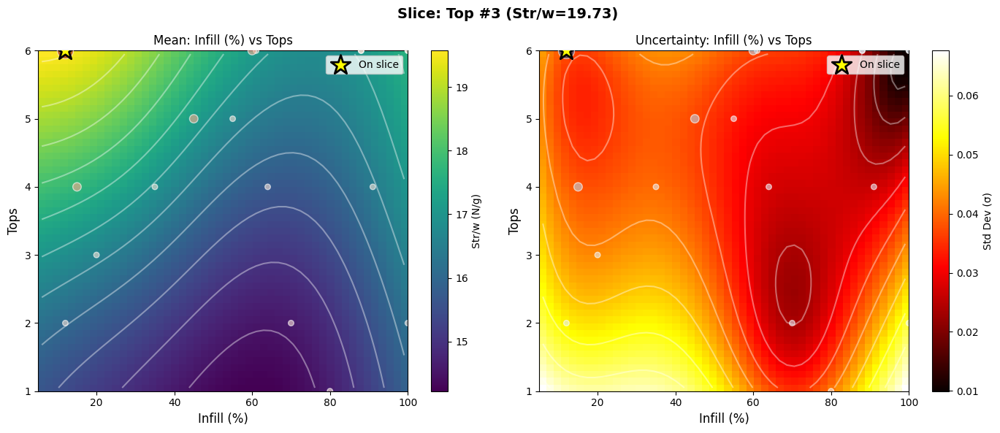

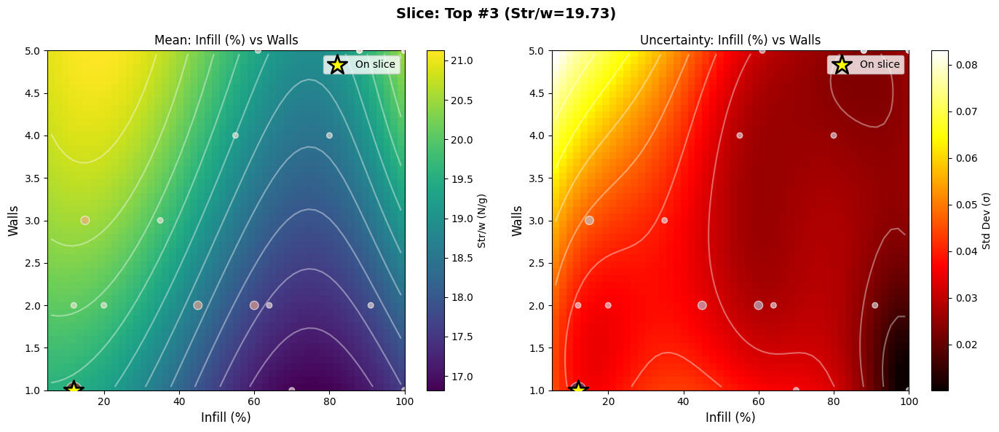

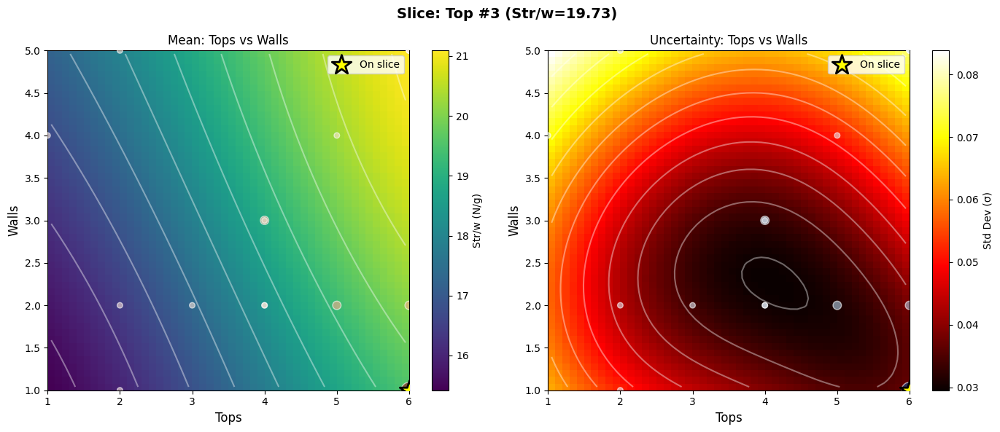

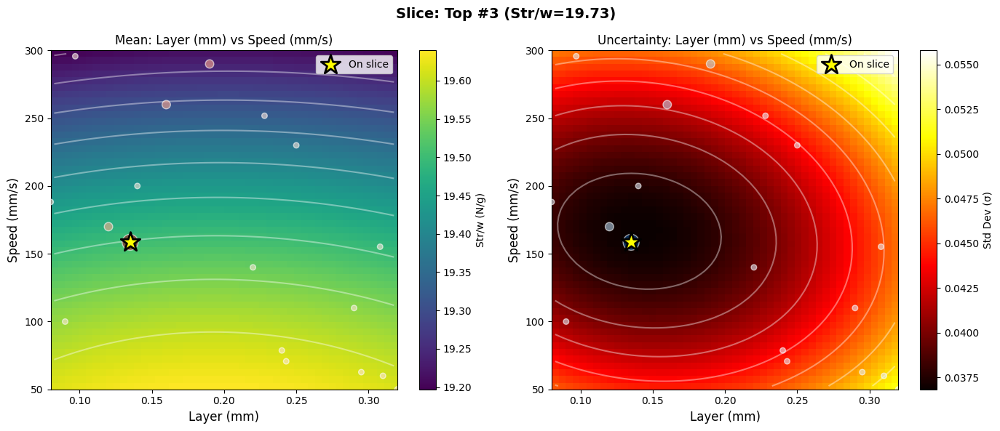

  Plotting slice: Rec: EI #1
    Point distribution by proximity:
      Very close (<0.15): 0
      Close (0.15-0.30): 0
      Moderate (0.30-0.50): 1
      Far (0.50-0.75): 2
      Very far (>0.75): 15


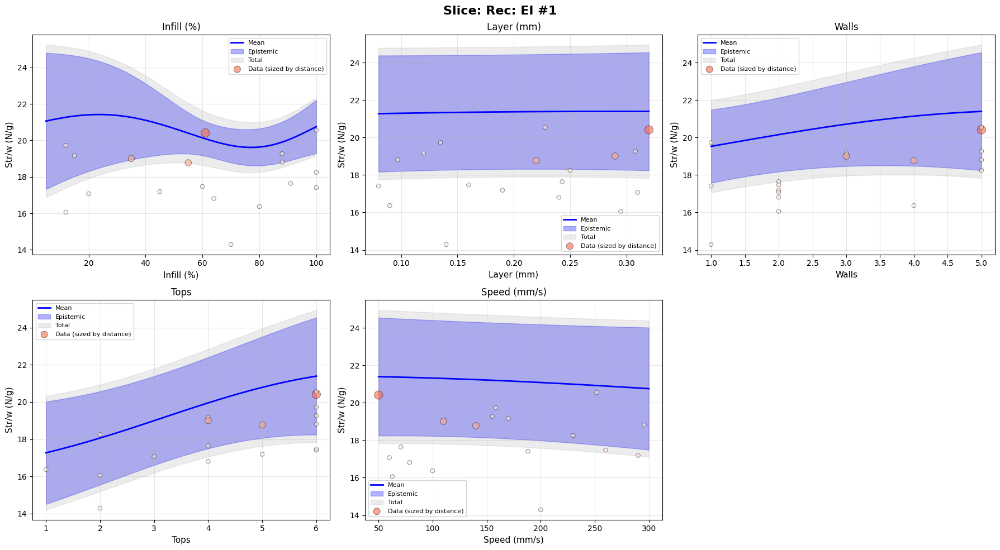

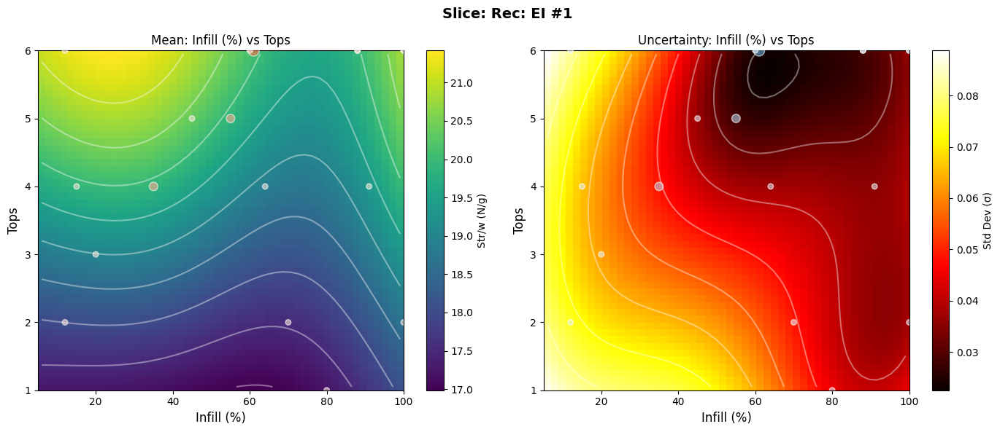

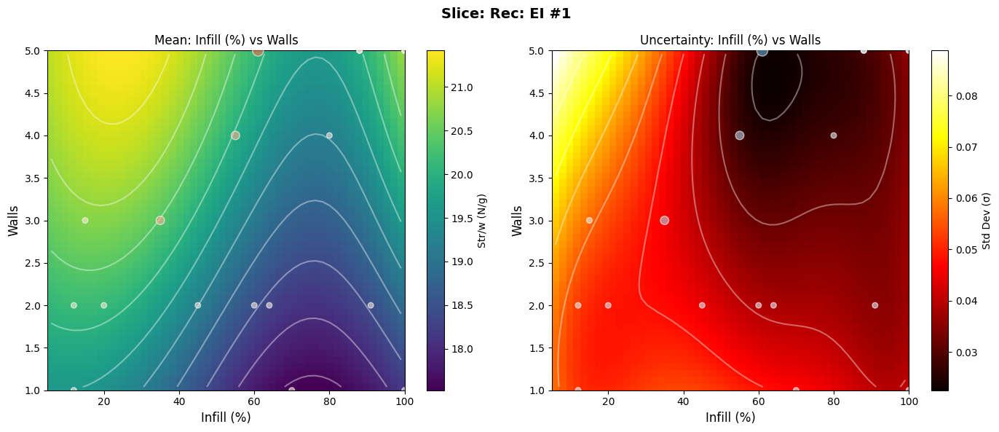

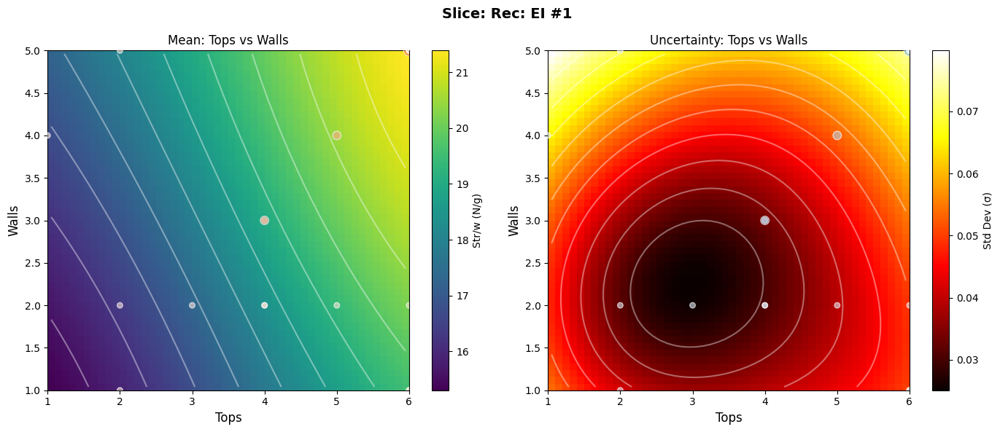

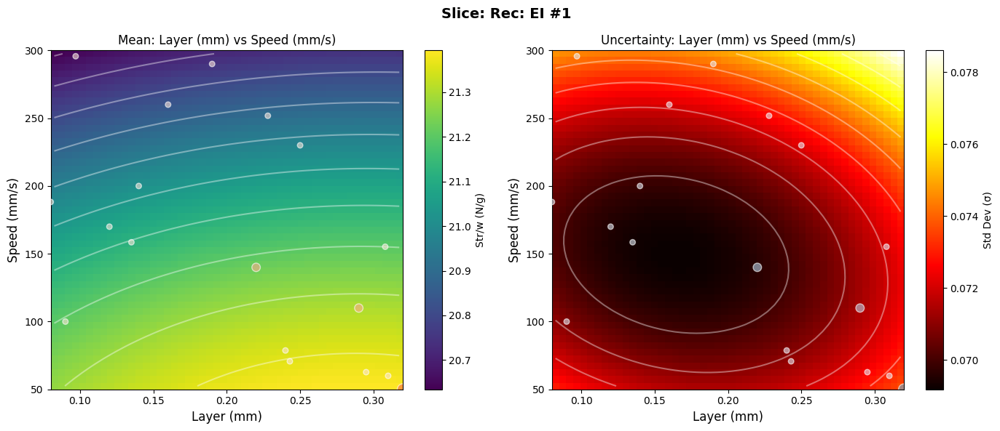

  Plotting slice: Rec: EI #2
    Point distribution by proximity:
      Very close (<0.15): 0
      Close (0.15-0.30): 0
      Moderate (0.30-0.50): 0
      Far (0.50-0.75): 0
      Very far (>0.75): 18


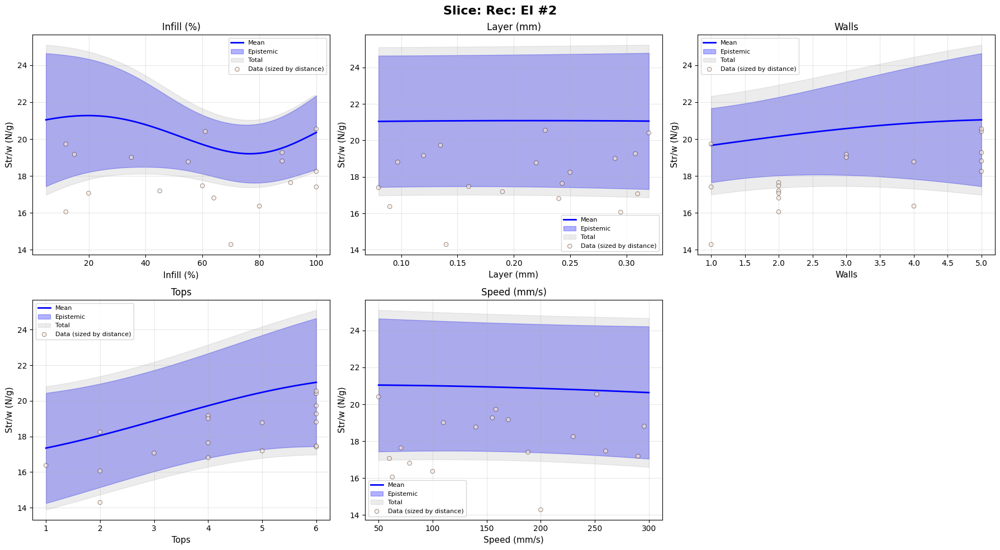

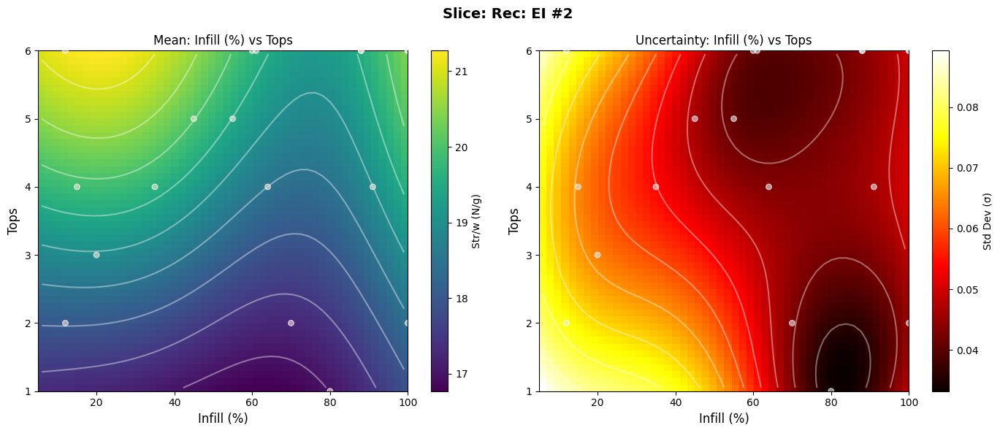

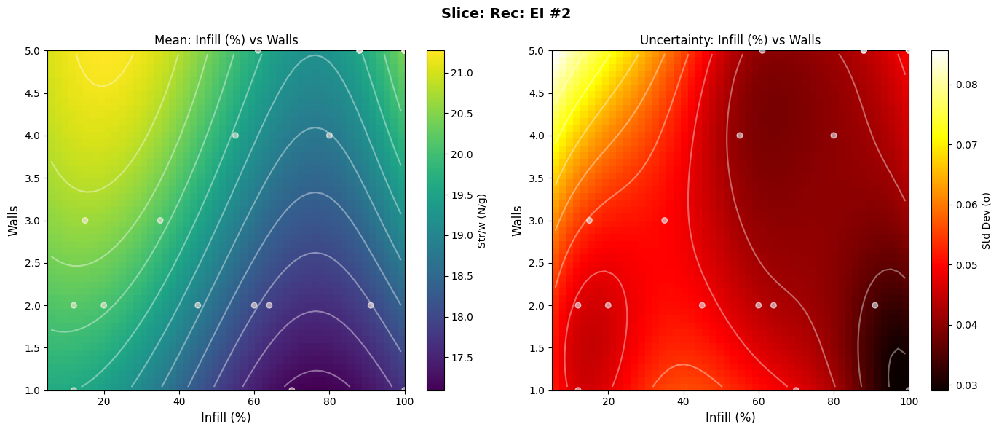

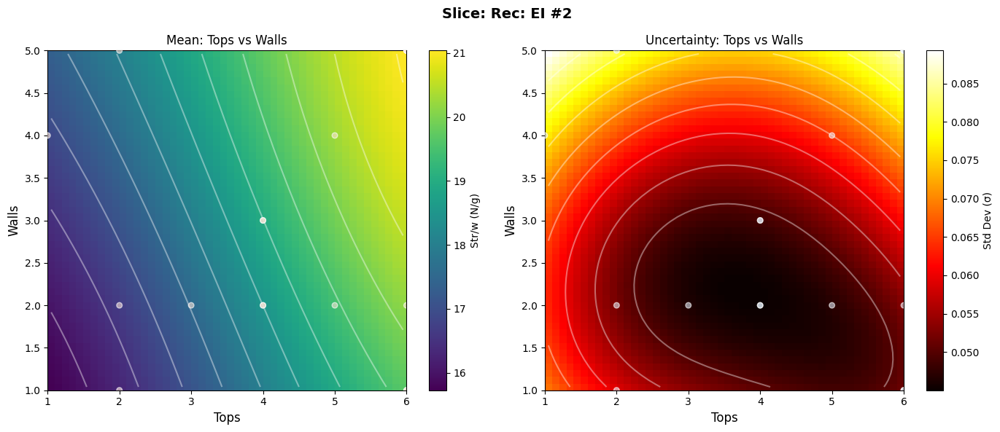

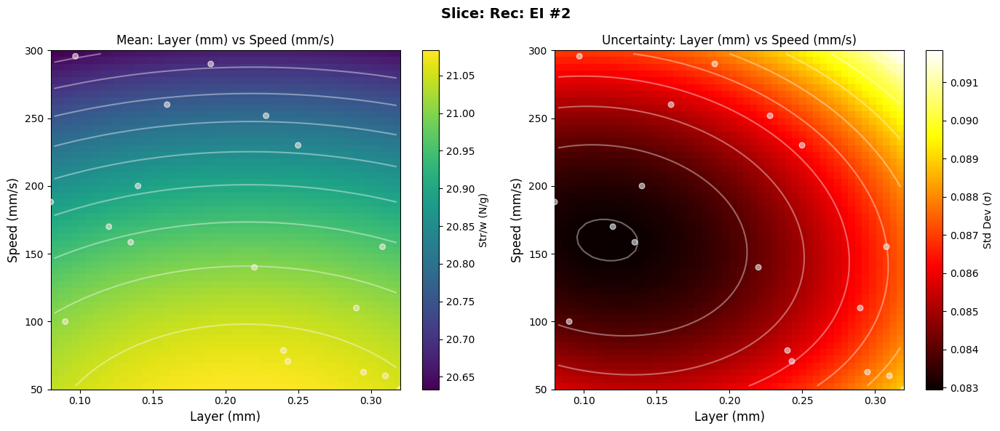

  Plotting slice: Rec: EI #3
    Point distribution by proximity:
      Very close (<0.15): 0
      Close (0.15-0.30): 0
      Moderate (0.30-0.50): 1
      Far (0.50-0.75): 2
      Very far (>0.75): 15


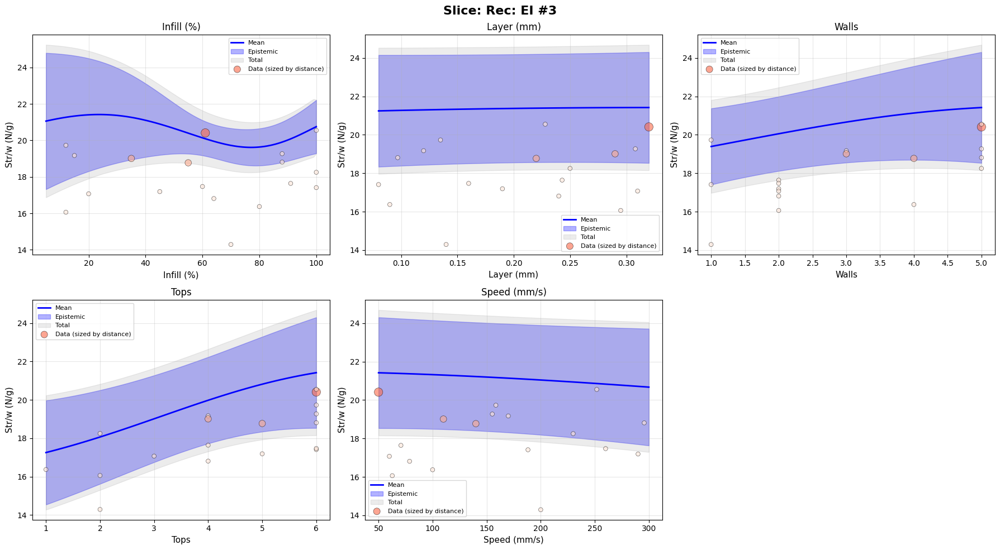

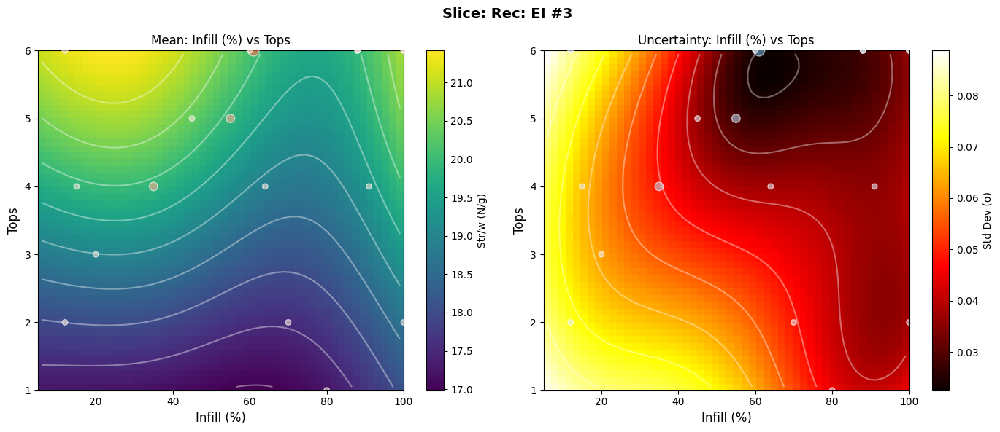

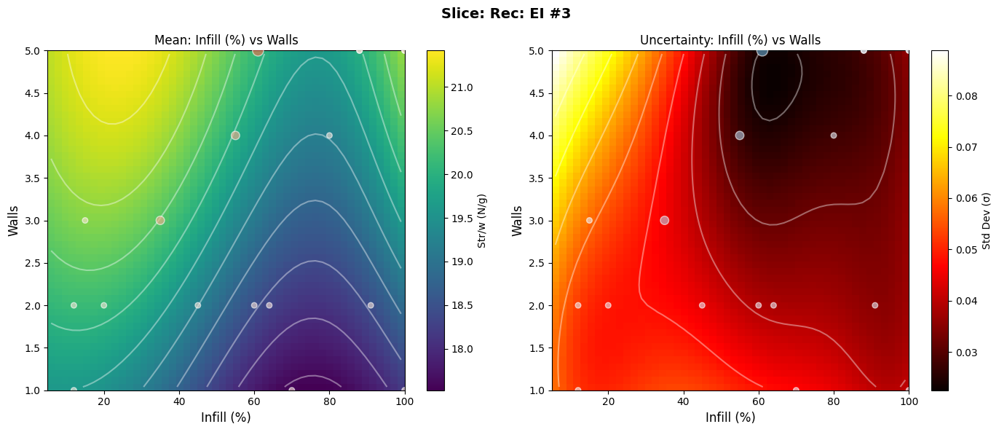

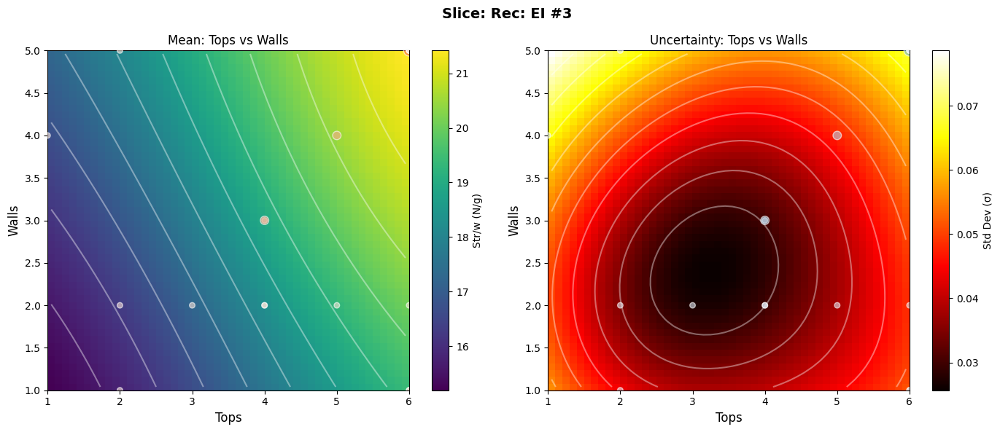

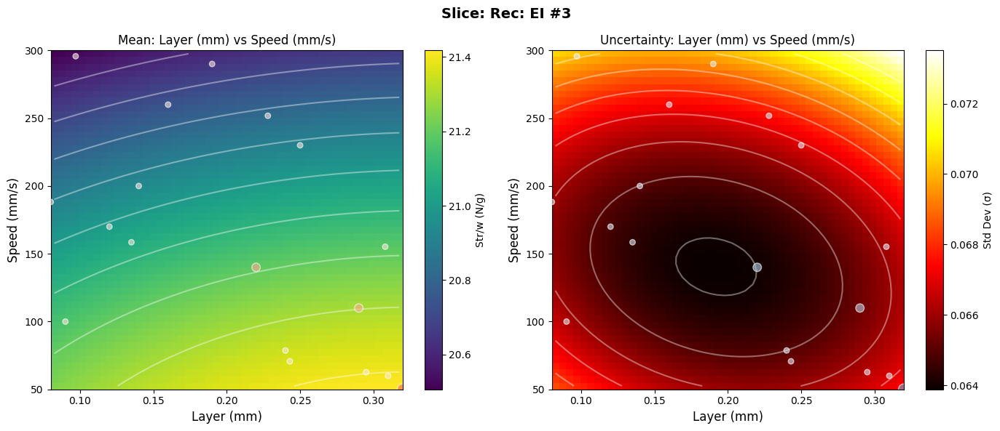

  Plotting slice: Rec: UCB #1
    Point distribution by proximity:
      Very close (<0.15): 0
      Close (0.15-0.30): 0
      Moderate (0.30-0.50): 0
      Far (0.50-0.75): 1
      Very far (>0.75): 17


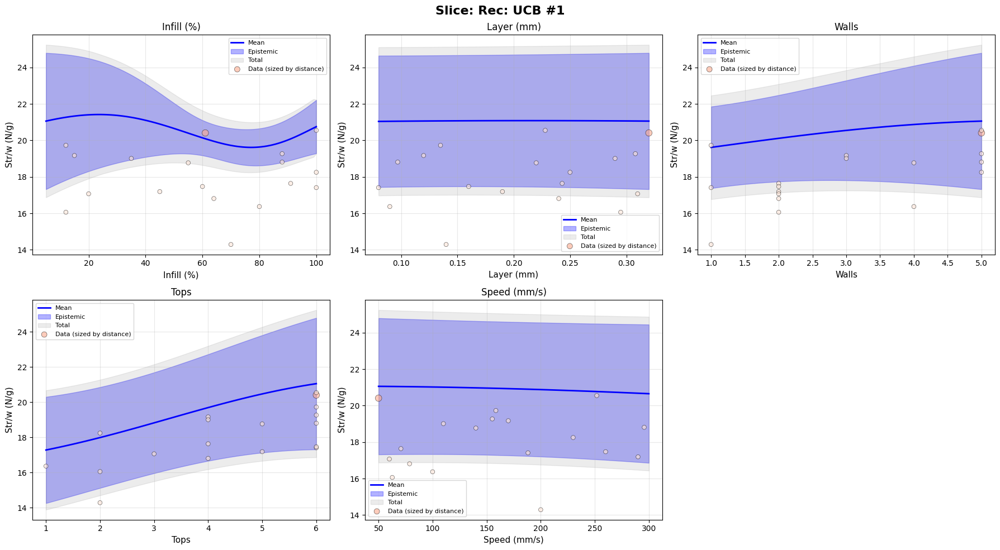

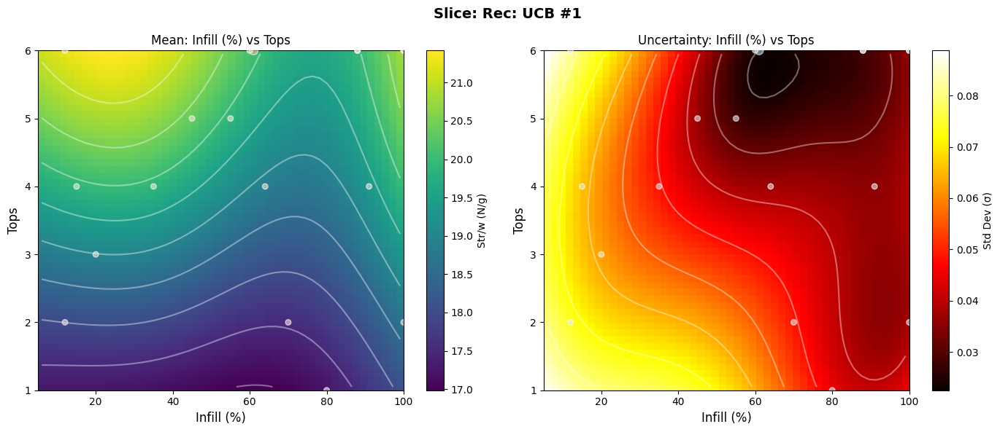

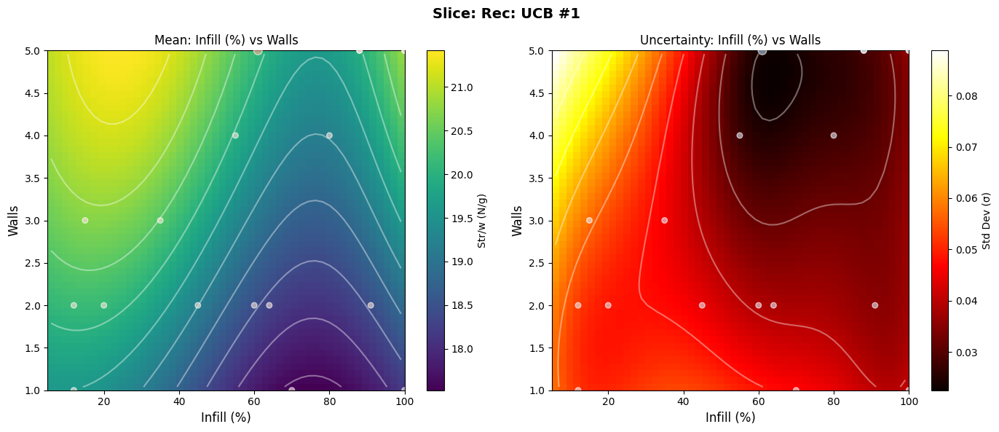

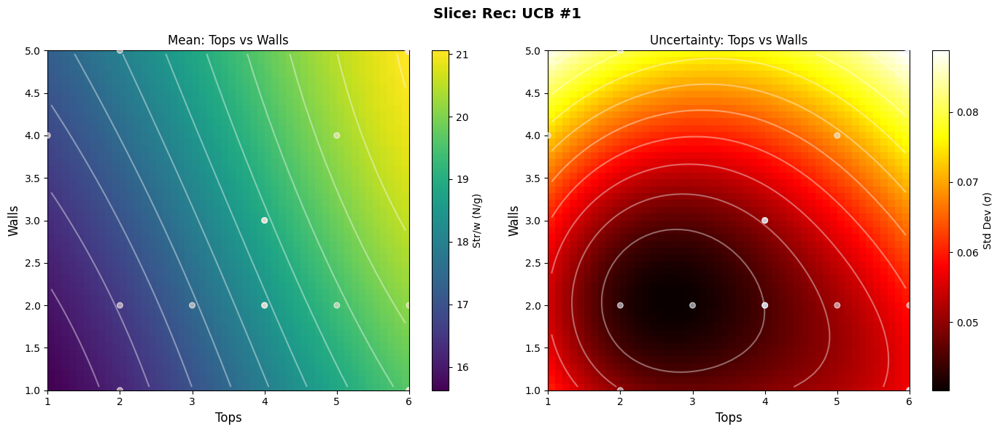

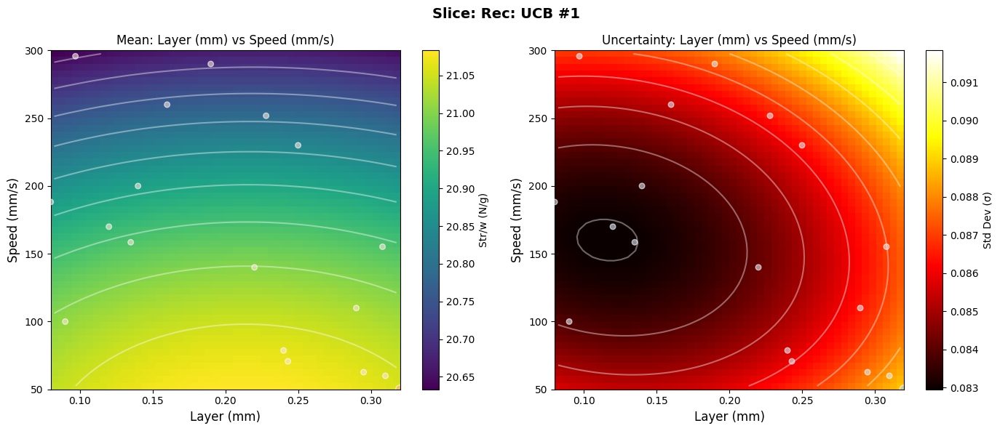

  Plotting slice: Rec: UCB #2
    Point distribution by proximity:
      Very close (<0.15): 0
      Close (0.15-0.30): 0
      Moderate (0.30-0.50): 0
      Far (0.50-0.75): 0
      Very far (>0.75): 18


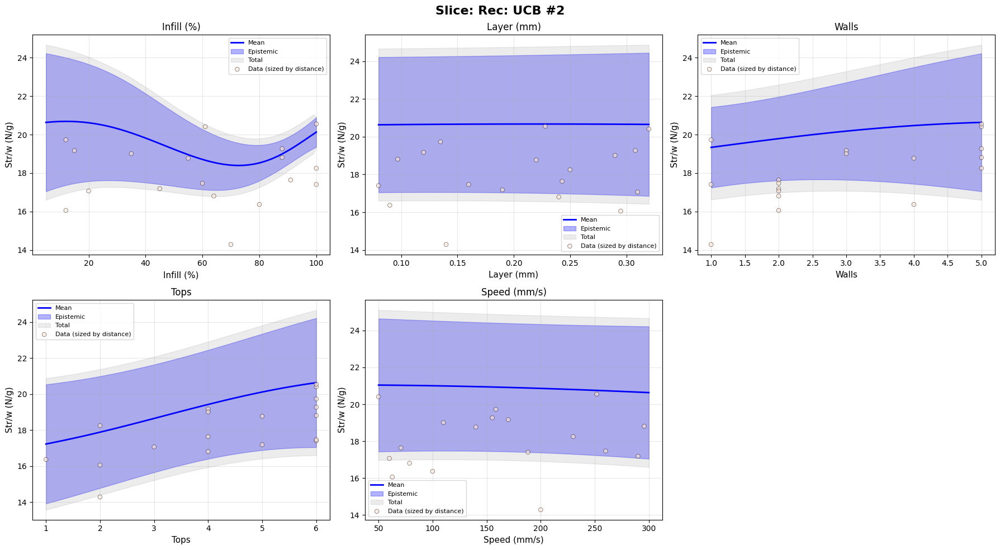

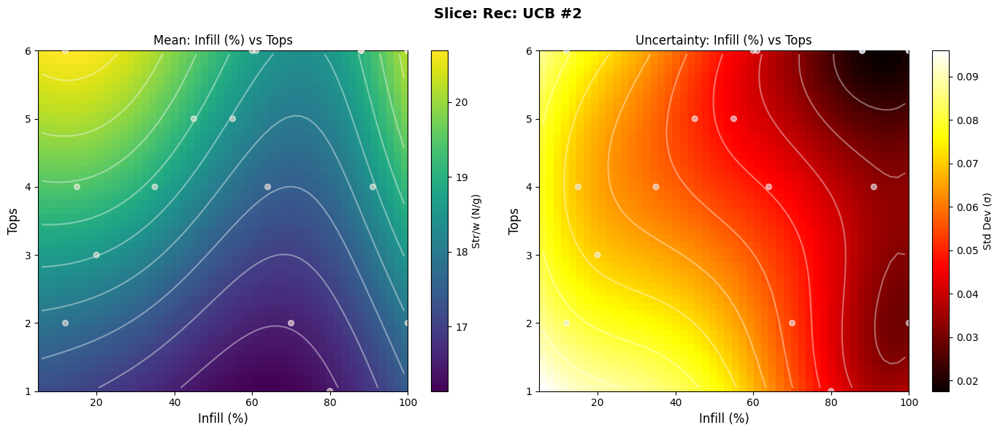

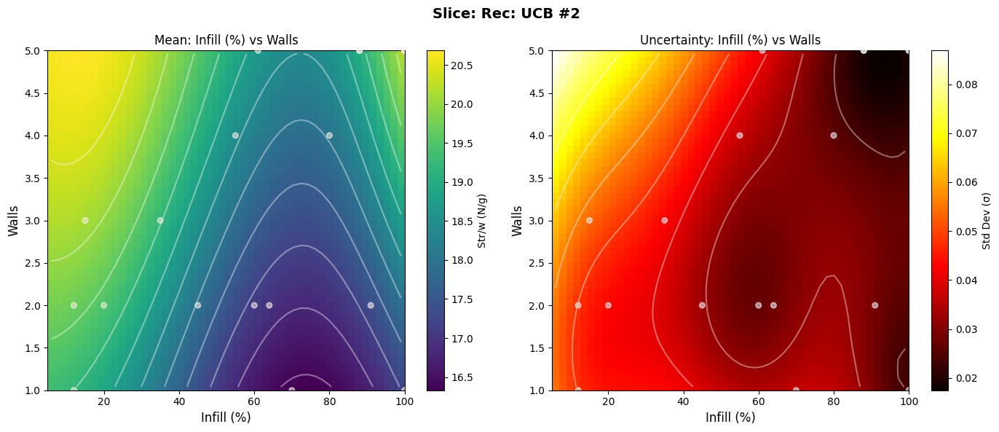

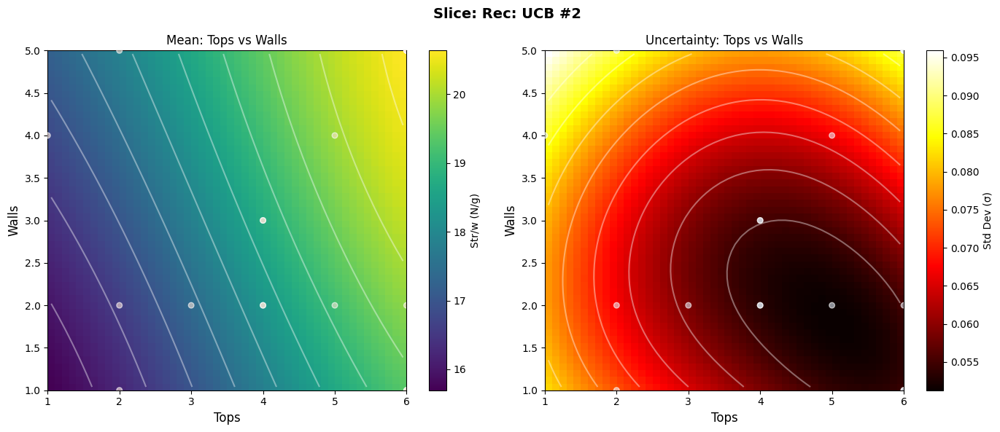

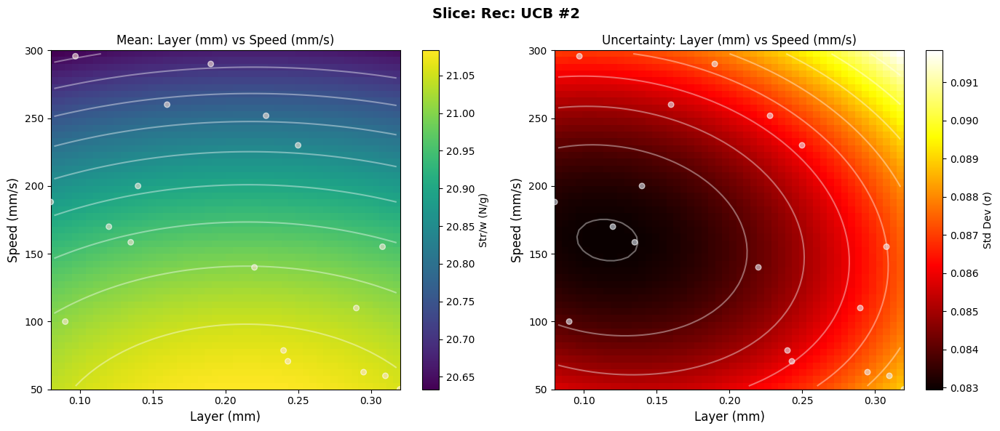

  Plotting slice: Rec: UCB #3
    Point distribution by proximity:
      Very close (<0.15): 0
      Close (0.15-0.30): 0
      Moderate (0.30-0.50): 0
      Far (0.50-0.75): 0
      Very far (>0.75): 18


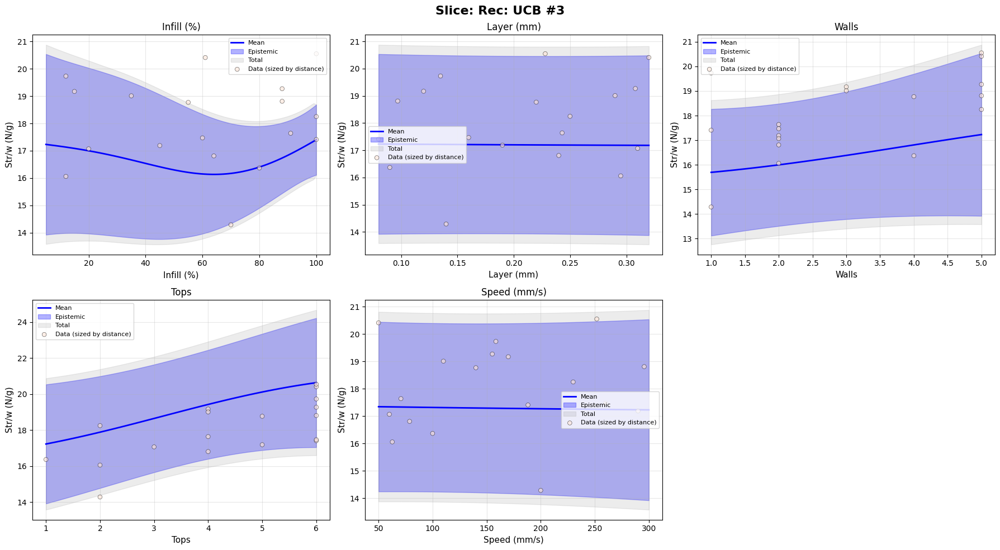

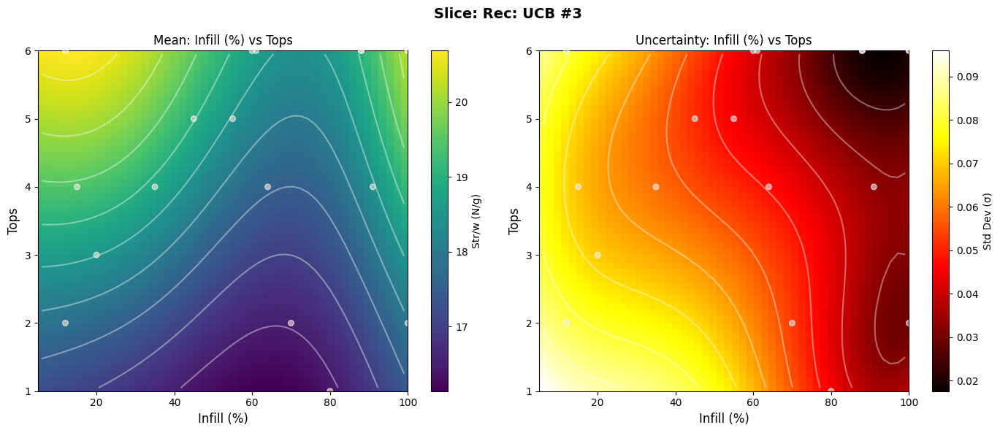

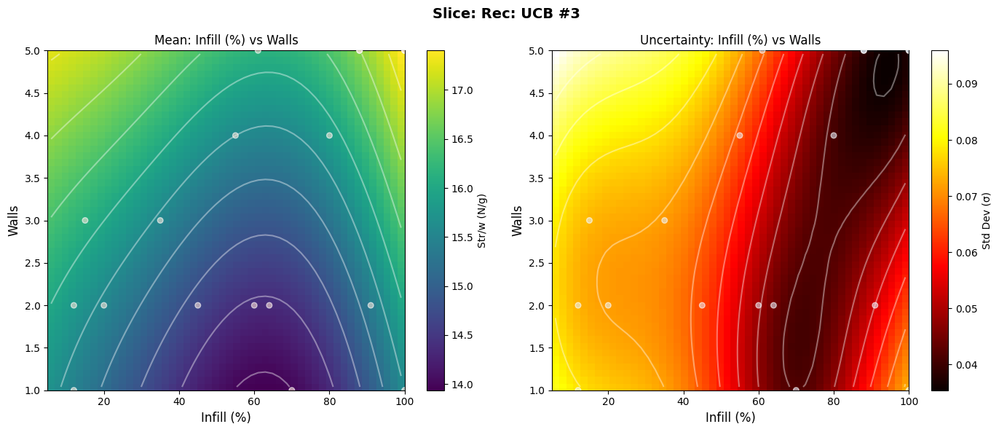

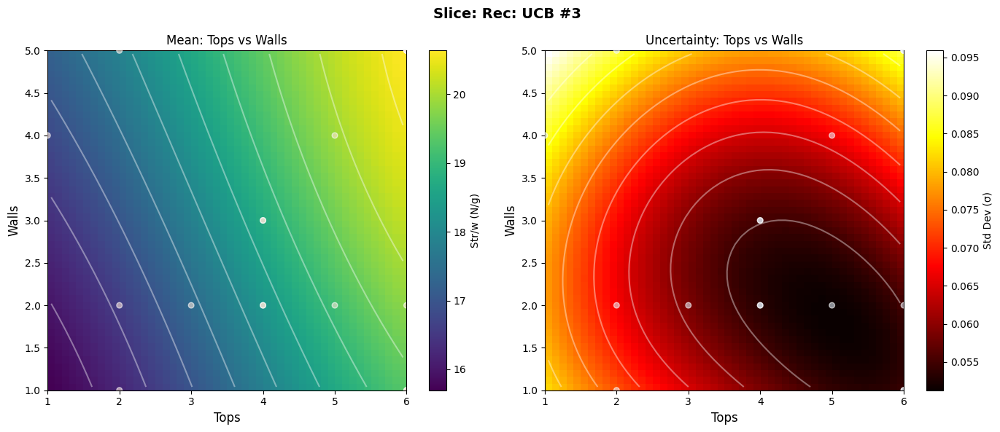

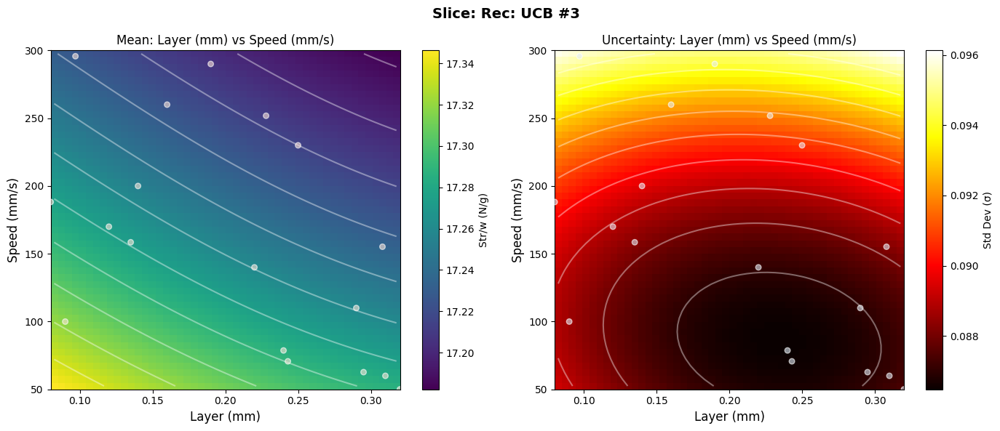


✓ ALL PLOTS COMPLETE!
Generated plots:
  - 1 global 1D plot (5 subplots)
  - 4 global 2D contour pairs
  - 9 slice-specific plot sets
  Total: 50 figures


In [23]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import Matern, ConstantKernel
from matplotlib.patches import Circle
import warnings

warnings.filterwarnings("ignore")

# ==========================================
# CONFIGURATION
# ==========================================
CSV_FILE = "data.csv"

COL_MAP = {
    'infill': 'Infill percent',
    'layer': 'Layer Height(mm)',
    'walls': 'Wall Loops',
    'tops': 'Top Layers',
    'speed': 'Print speed settings',
    'target': 'Str/w (N/g)',
}

BOUNDS = {
    'infill': (5, 100),
    'layer': (0.08, 0.32),
    'walls': (1, 5),
    'tops': (1, 6),
    'speed': (50, 300)
}

PARAM_NAMES = ['Infill (%)', 'Layer (mm)', 'Walls', 'Tops', 'Speed (mm/s)']

# ==========================================
# HELPER FUNCTIONS
# ==========================================
def get_noise_variance(infill_percent):
    """Input-dependent noise model"""
    if infill_percent >= 100:
        return 1.81e-05
    elif infill_percent >= 99:
        t = (infill_percent - 99.0) / (100.0 - 99.0)
        return 3.0e-04 * (1 - t) + 1.81e-05 * t
    elif infill_percent >= 25:
        t = (infill_percent - 25.0) / (99.0 - 25.0)
        return 1.26e-03 * (1 - t) + 3.0e-04 * t
    else:
        t = (infill_percent - 5.0) / (25.0 - 5.0)
        noise_at_5_percent = 2.0e-03
        return noise_at_5_percent * (1 - t) + 1.26e-03 * t

def get_alpha_array(X_norm, bounds_dict):
    """Compute alpha array for input-dependent noise"""
    infill_norm = X_norm[:, 0]
    infill_actual = infill_norm * (bounds_dict['infill'][1] - bounds_dict['infill'][0]) + bounds_dict['infill'][0]
    alpha_array = np.array([get_noise_variance(inf) for inf in infill_actual])
    return alpha_array

def normalize(X, bounds=BOUNDS):
    X_n = np.copy(X).astype(float)
    keys = list(bounds.keys())
    for i, k in enumerate(keys):
        X_n[:,i] = (X[:,i] - bounds[k][0]) / (bounds[k][1] - bounds[k][0])
    return X_n

def denormalize(X_n, bounds=BOUNDS):
    X = np.copy(X_n)
    keys = list(bounds.keys())
    for i, k in enumerate(keys):
        X[:,i] = X_n[:,i] * (bounds[k][1] - bounds[k][0]) + bounds[k][0]
    return X

def get_point_sizes(X_norm, slice_point_norm, max_distance=0.5):
    """
    Compute marker sizes based on distance from slice using buckets.
    Points are categorized into proximity tiers with distinct sizes.
    """
    distances = np.linalg.norm(X_norm - slice_point_norm, axis=1)

    sizes = np.zeros_like(distances)
    colors = np.zeros_like(distances)

    # Assign sizes based on buckets
    bucket1 = distances < 0.15
    bucket2 = (distances >= 0.15) & (distances < 0.30)
    bucket3 = (distances >= 0.30) & (distances < 0.50)
    bucket4 = (distances >= 0.50) & (distances < 0.75)
    bucket5 = distances >= 0.75

    sizes[bucket1] = 250
    sizes[bucket2] = 180
    sizes[bucket3] = 120
    sizes[bucket4] = 70
    sizes[bucket5] = 30

    colors[bucket1] = 0.9
    colors[bucket2] = 0.7
    colors[bucket3] = 0.5
    colors[bucket4] = 0.3
    colors[bucket5] = 0.1

    return sizes, distances, colors

# ==========================================
# LOAD DATA & TRAIN GP
# ==========================================
print("Loading data and training GP...")
df = pd.read_csv(CSV_FILE)
X = df[[COL_MAP['infill'], COL_MAP['layer'], COL_MAP['walls'],
        COL_MAP['tops'], COL_MAP['speed']]].values
y = df[COL_MAP['target']].values.astype(float)

X_norm = normalize(X)
y_log = np.log(y)
y_mean = np.mean(y_log)
y_centered = y_log - y_mean

alpha_array = get_alpha_array(X_norm, BOUNDS)
kernel = ConstantKernel(1.0) * Matern(length_scale=[0.5]*5, length_scale_bounds=(0.3, 5.0), nu=2.5)
gp = GaussianProcessRegressor(kernel=kernel, n_restarts_optimizer=25, alpha=alpha_array, normalize_y=False)
gp.fit(X_norm, y_centered)

try:
    rec_norm = np.load("bo_recommendations_norm.npy")
    rec_labels = np.load("bo_labels.npy", allow_pickle=True)
    HAS_RECOMMENDATIONS = True
    print(f"✓ Loaded {len(rec_norm)} recommendations")
except:
    HAS_RECOMMENDATIONS = False
    print("⚠️ No recommendations found - plotting data only")

# ==========================================
# 1D PLOTS: EACH VARIABLE VS STR/W
# ==========================================
print("\nGenerating 1D plots...")

fig, axes = plt.subplots(2, 3, figsize=(18, 10))
axes = axes.flatten()

for dim in range(5):
    ax = axes[dim]

    n_test = 100
    X_test_norm = np.tile(np.mean(X_norm, axis=0), (n_test, 1))
    X_test_norm[:, dim] = np.linspace(0, 1, n_test)

    mu, sigma = gp.predict(X_test_norm, return_std=True)
    mu_real = np.exp(mu + y_mean)
    epistemic_std = np.exp(mu + y_mean) * sigma

    X_test_denorm = denormalize(X_test_norm)
    aleatory_var = np.array([get_noise_variance(inf) for inf in X_test_denorm[:, 0]])
    aleatory_std = np.exp(mu + y_mean) * np.sqrt(aleatory_var)
    total_std = np.sqrt(epistemic_std**2 + aleatory_std**2)

    x_vals = X_test_denorm[:, dim]

    ax.plot(x_vals, mu_real, 'b-', linewidth=2, label='Mean prediction')
    ax.fill_between(x_vals, mu_real - 2*epistemic_std, mu_real + 2*epistemic_std,
                     alpha=0.3, color='blue', label='Epistemic (±2σ)')
    ax.fill_between(x_vals, mu_real - 2*total_std, mu_real + 2*total_std,
                     alpha=0.15, color='gray', label='Total (epistemic + aleatory)')

    X_denorm = denormalize(X_norm)
    ax.scatter(X_denorm[:, dim], y, c='red', s=50, alpha=0.6, edgecolors='black',
               linewidths=1, label='Data', zorder=5)

    ax.set_xlabel(PARAM_NAMES[dim], fontsize=11)
    ax.set_ylabel('Str/w (N/g)', fontsize=11)
    ax.set_title(f'{PARAM_NAMES[dim]} vs Str/w', fontsize=12, fontweight='bold')
    ax.legend(fontsize=8)
    ax.grid(alpha=0.3)

axes[5].axis('off')
plt.tight_layout()
plt.savefig('1d_plots_all_params.png', dpi=150, bbox_inches='tight')
plt.show()

# ==========================================
# 2D CONTOUR PLOTS: GLOBAL AVERAGES
# ==========================================
print("\nGenerating 2D contour plots (global averages)...")

combos = [
    (0, 3, 'Infill (%)', 'Tops'),
    (0, 2, 'Infill (%)', 'Walls'),
    (3, 2, 'Tops', 'Walls'),
    (1, 4, 'Layer (mm)', 'Speed (mm/s)')
]

for dim1, dim2, name1, name2 in combos:
    fig, axes = plt.subplots(1, 2, figsize=(14, 6))

    res = 50
    grid_x = np.linspace(0, 1, res)
    grid_y = np.linspace(0, 1, res)
    X_grid, Y_grid = np.meshgrid(grid_x, grid_y)

    X_test = np.tile(np.mean(X_norm, axis=0), (res*res, 1))
    X_test[:, dim1] = X_grid.ravel()
    X_test[:, dim2] = Y_grid.ravel()

    mu, sigma = gp.predict(X_test, return_std=True)
    mu_real = np.exp(mu + y_mean).reshape(res, res)
    sigma_real = sigma.reshape(res, res)

    keys = list(BOUNDS.keys())
    x_vals = grid_x * (BOUNDS[keys[dim1]][1] - BOUNDS[keys[dim1]][0]) + BOUNDS[keys[dim1]][0]
    y_vals = grid_y * (BOUNDS[keys[dim2]][1] - BOUNDS[keys[dim2]][0]) + BOUNDS[keys[dim2]][0]
    extent = [x_vals[0], x_vals[-1], y_vals[0], y_vals[-1]]

    im1 = axes[0].imshow(mu_real, origin='lower', extent=extent, aspect='auto', cmap='viridis')
    axes[0].contour(mu_real, origin='lower', extent=extent, colors='white', alpha=0.4, levels=10)
    axes[0].set_xlabel(name1, fontsize=12)
    axes[0].set_ylabel(name2, fontsize=12)
    axes[0].set_title(f'Mean Prediction: {name1} vs {name2}', fontsize=13, fontweight='bold')

    X_denorm = denormalize(X_norm)
    axes[0].scatter(X_denorm[:, dim1], X_denorm[:, dim2], c='red', s=80,
                   edgecolors='white', linewidths=2, label='Data', zorder=10)

    if HAS_RECOMMENDATIONS:
        rec_denorm = denormalize(rec_norm)
        axes[0].scatter(rec_denorm[:, dim1], rec_denorm[:, dim2], c='lime', s=150,
                       marker='*', edgecolors='black', linewidths=1.5, label='BO Recommendations', zorder=11)

    axes[0].legend()
    plt.colorbar(im1, ax=axes[0], label='Str/w (N/g)')

    im2 = axes[1].imshow(sigma_real, origin='lower', extent=extent, aspect='auto', cmap='hot')
    axes[1].contour(sigma_real, origin='lower', extent=extent, colors='white', alpha=0.4, levels=10)
    axes[1].set_xlabel(name1, fontsize=12)
    axes[1].set_ylabel(name2, fontsize=12)
    axes[1].set_title(f'Uncertainty (σ): {name1} vs {name2}', fontsize=13, fontweight='bold')
    axes[1].scatter(X_denorm[:, dim1], X_denorm[:, dim2], c='cyan', s=80,
                   edgecolors='white', linewidths=2, label='Data', zorder=10)
    if HAS_RECOMMENDATIONS:
        axes[1].scatter(rec_denorm[:, dim1], rec_denorm[:, dim2], c='lime', s=150,
                       marker='*', edgecolors='black', linewidths=1.5, label='BO Recommendations', zorder=11)
    axes[1].legend()
    plt.colorbar(im2, ax=axes[1], label='Std Dev (σ)')

    plt.tight_layout()
    plt.savefig(f'2d_contour_{name1.split()[0]}_{name2.split()[0]}_global.png', dpi=150, bbox_inches='tight')
    plt.show()

print("\n✓ Global plots complete!")

# ==========================================
# SLICE PLOTS
# ==========================================
print("\nGenerating slice plots...")

def plot_slice(slice_point_norm, slice_name, slice_idx):
    """Generate all plots for a specific slice"""

    print(f"  Plotting slice: {slice_name}")

    clean_name = slice_name.replace('#', 'num').replace('(', '').replace(')', '').replace('=', '').replace(':', '').replace('/', '_').replace(' ', '_')

    point_sizes, point_distances, point_colors = get_point_sizes(X_norm, slice_point_norm)
    on_slice = point_distances < 0.1

    print(f"    Point distribution by proximity:")
    print(f"      Very close (<0.15): {np.sum(point_distances < 0.15)}")
    print(f"      Close (0.15-0.30): {np.sum((point_distances >= 0.15) & (point_distances < 0.30))}")
    print(f"      Moderate (0.30-0.50): {np.sum((point_distances >= 0.30) & (point_distances < 0.50))}")
    print(f"      Far (0.50-0.75): {np.sum((point_distances >= 0.50) & (point_distances < 0.75))}")
    print(f"      Very far (>0.75): {np.sum(point_distances >= 0.75)}")

    # 1D Plots
    fig, axes = plt.subplots(2, 3, figsize=(18, 10))
    axes = axes.flatten()
    fig.suptitle(f'Slice: {slice_name}', fontsize=16, fontweight='bold')

    for dim in range(5):
        ax = axes[dim]

        n_test = 100
        X_test_norm = np.tile(slice_point_norm, (n_test, 1))
        X_test_norm[:, dim] = np.linspace(0, 1, n_test)

        mu, sigma = gp.predict(X_test_norm, return_std=True)
        mu_real = np.exp(mu + y_mean)
        epistemic_std = np.exp(mu + y_mean) * sigma

        X_test_denorm = denormalize(X_test_norm)
        aleatory_var = np.array([get_noise_variance(inf) for inf in X_test_denorm[:, 0]])
        aleatory_std = np.exp(mu + y_mean) * np.sqrt(aleatory_var)
        total_std = np.sqrt(epistemic_std**2 + aleatory_std**2)

        x_vals = X_test_denorm[:, dim]

        ax.plot(x_vals, mu_real, 'b-', linewidth=2, label='Mean')
        ax.fill_between(x_vals, mu_real - 2*epistemic_std, mu_real + 2*epistemic_std,
                         alpha=0.3, color='blue', label='Epistemic')
        ax.fill_between(x_vals, mu_real - 2*total_std, mu_real + 2*total_std,
                         alpha=0.15, color='gray', label='Total')

        X_denorm = denormalize(X_norm)
        scatter = ax.scatter(X_denorm[:, dim], y, s=point_sizes,
                            c=point_colors, cmap='Reds', vmin=0, vmax=1,
                            alpha=0.6, edgecolors='black', linewidths=0.5,
                            zorder=5, label='Data (sized by distance)')

        if np.any(on_slice):
            ax.scatter(X_denorm[on_slice, dim], y[on_slice], s=400, marker='*',
                      c='yellow', edgecolors='black', linewidths=2, zorder=10,
                      label='On slice')

        ax.set_xlabel(PARAM_NAMES[dim], fontsize=11)
        ax.set_ylabel('Str/w (N/g)', fontsize=11)
        ax.set_title(f'{PARAM_NAMES[dim]}', fontsize=12)
        ax.legend(fontsize=8)
        ax.grid(alpha=0.3)

    axes[5].axis('off')
    plt.tight_layout()
    plt.savefig(f'slice_{slice_idx:02d}_{clean_name}_1d.png', dpi=150, bbox_inches='tight')
    plt.show()

    # 2D Contours
    for dim1, dim2, name1, name2 in combos:
        fig, axes = plt.subplots(1, 2, figsize=(14, 6))
        fig.suptitle(f'Slice: {slice_name}', fontsize=14, fontweight='bold')

        res = 50
        grid_x = np.linspace(0, 1, res)
        grid_y = np.linspace(0, 1, res)
        X_grid, Y_grid = np.meshgrid(grid_x, grid_y)

        X_test = np.tile(slice_point_norm, (res*res, 1))
        X_test[:, dim1] = X_grid.ravel()
        X_test[:, dim2] = Y_grid.ravel()

        mu, sigma = gp.predict(X_test, return_std=True)
        mu_real = np.exp(mu + y_mean).reshape(res, res)
        sigma_real = sigma.reshape(res, res)

        keys = list(BOUNDS.keys())
        x_vals = grid_x * (BOUNDS[keys[dim1]][1] - BOUNDS[keys[dim1]][0]) + BOUNDS[keys[dim1]][0]
        y_vals = grid_y * (BOUNDS[keys[dim2]][1] - BOUNDS[keys[dim2]][0]) + BOUNDS[keys[dim2]][0]
        extent = [x_vals[0], x_vals[-1], y_vals[0], y_vals[-1]]

        im1 = axes[0].imshow(mu_real, origin='lower', extent=extent, aspect='auto', cmap='viridis')
        axes[0].contour(mu_real, origin='lower', extent=extent, colors='white', alpha=0.4, levels=10)
        axes[0].set_xlabel(name1, fontsize=12)
        axes[0].set_ylabel(name2, fontsize=12)
        axes[0].set_title(f'Mean: {name1} vs {name2}', fontsize=12)

        X_denorm = denormalize(X_norm)
        axes[0].scatter(X_denorm[:, dim1], X_denorm[:, dim2], s=point_sizes,
                       c=point_colors, cmap='Reds', vmin=0, vmax=1,
                       alpha=0.6, edgecolors='white', linewidths=1, zorder=5)

        if np.any(on_slice):
            axes[0].scatter(X_denorm[on_slice, dim1], X_denorm[on_slice, dim2],
                           s=400, marker='*', c='yellow', edgecolors='black',
                           linewidths=2, zorder=10, label='On slice')
            axes[0].legend()

        plt.colorbar(im1, ax=axes[0], label='Str/w (N/g)')

        im2 = axes[1].imshow(sigma_real, origin='lower', extent=extent, aspect='auto', cmap='hot')
        axes[1].contour(sigma_real, origin='lower', extent=extent, colors='white', alpha=0.4, levels=10)
        axes[1].set_xlabel(name1, fontsize=12)
        axes[1].set_ylabel(name2, fontsize=12)
        axes[1].set_title(f'Uncertainty: {name1} vs {name2}', fontsize=12)

        axes[1].scatter(X_denorm[:, dim1], X_denorm[:, dim2], s=point_sizes,
                       c=point_colors, cmap='Blues', vmin=0, vmax=1,
                       alpha=0.6, edgecolors='white', linewidths=1, zorder=5)

        if np.any(on_slice):
            axes[1].scatter(X_denorm[on_slice, dim1], X_denorm[on_slice, dim2],
                           s=400, marker='*', c='yellow', edgecolors='black',
                           linewidths=2, zorder=10, label='On slice')
            axes[1].legend()

        plt.colorbar(im2, ax=axes[1], label='Std Dev (σ)')

        plt.tight_layout()
        plt.savefig(f'slice_{slice_idx:02d}_{clean_name}_{name1.split()[0]}_{name2.split()[0]}.png',
                   dpi=150, bbox_inches='tight')
        plt.show()

# Define slices
slices = []

top3_indices = np.argsort(y)[-3:][::-1]
for i, idx in enumerate(top3_indices):
    slice_name = f"Top #{i+1} (Str/w={y[idx]:.2f})"
    slices.append((X_norm[idx], slice_name))

if HAS_RECOMMENDATIONS:
    for i, (point, label) in enumerate(zip(rec_norm, rec_labels)):
        slice_name = f"Rec: {label}"
        slices.append((point, slice_name))

for idx, (slice_point, slice_name) in enumerate(slices):
    plot_slice(slice_point, slice_name, idx)

print("\n" + "="*70)
print("✓ ALL PLOTS COMPLETE!")
print("="*70)
print(f"Generated plots:")
print(f"  - 1 global 1D plot (5 subplots)")
print(f"  - {len(combos)} global 2D contour pairs")
print(f"  - {len(slices)} slice-specific plot sets")
print(f"  Total: {1 + len(combos) + len(slices) * (1 + len(combos))} figures")
print("="*70)